In [6]:
#!pip install hl7apy
from hl7apy import parser
from hl7apy.core import Message
import pandas as pd


In [7]:
# Chemin vers les fichiers texte fournis
file_path1 = r"D:\stage\data\EXEMPLE2_CAPSULE_HL7_WAVEFORM\exemples capsule waveforms monitoring philips en prod.txt"
file_path2 = r"D:\stage\data\EXEMPLE1_CAPSULE_HL7_BIOMED\exemples capsule equipements biomédicaux en prod.txt"
file_path3 = r"D:\stage\data\EXEMPLE1_CAPSULE_HL7_WAVEFORM\CAPSULE_exemple HL7 5 waveform Saint Denis.txt"

In [8]:
# Lire le fichier avec pandas pour vérifier la structure brute
with open(file_path1, 'r') as file:
    content_file1 = file.read()
    
print('Contenu du Fichier 1 : \n',content_file1[:1500])

# Segment : est un bloc par 'MSH' et se termine par '?' encadré. Ce segment contient des champs de données de différentes longueurs
# Data filds (Champs de données):
        # MSH : message header
        # PID : patient identifiant
        # PV1 : patient visit
        # OBR : observation demande
        # OBX (3 dans notre cas) : observation results

Contenu du Fichier 1 : 
 MSH|^~\&|DATACAPTOR||||20240416152513||ORU^R01|4416152513078d02|P|2.3||||||8859/1|
PID|
PV1||I|LIT5|
OBR|||||||20240416152513|||LIT5|||LIT5|
OBX|1|NA|5141||0.11^0.115^0.12^0.12^0.115^0.11^0.105^0.095^0.09^0.085^0.085^0.085^0.085^0.09^0.09^0.095^0.1^0.105^0.11^0.115^0.12^0.125^0.13^0.13^0.135^0.135^0.135^0.14^0.14^0.14^0.14^0.14^0.135^0.125^0.115^0.105^0.09^0.08^0.065^0.05^0.035^0.025^0.015^0.015^0.01^0.01^0.005^0.005^-0^-0^-0^-0^-0^-0^-0^0.005^0.005^0.005^0.005^0.005^-0^-0.005^-0.01^-0.015^-0.02^-0.025^-0.03^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.025^-0.025^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.01^-0.005^0.005^0.015^0.04^0.065^0.105^0.155^0.22^0.295^0.38^0.47^0.57^0.67^0.765^0.85^0.915^0.95^0.965^0.955^0.925^0.88^0.815^0.735^0.64^0.545^0.45^0.365^0.295^0.23^0.165^0.115^0.065^0.025^-0.005^-0.03^-0.05^-0.065^-0.08^-0.095^-0.105^-0.11^-0.12^-0.125^-0.13^-0.135|47|||||F||2.0009|20240416152513|
OBX|2|NA|8858||95.3125^94.9375^94.5625^94.1875^93.8125^93

In [9]:
# Lire le fichier avec pandas pour vérifier la structure brute
with open(file_path2, 'r') as file:
    content_file2 = file.read()
    
print('Contenu du Fichier 2 : \n',content_file2[:1000])

# On remarque que dans ce deuxième fichier, le premier segment n'est pas bien construit,
# il lui manque les deux champs de données 'MSH' et 'PID'
# Par conséquent, il est possible que ce segment soit supprimer dans la suite de ce notebook

Contenu du Fichier 2 : 
 MSH|^~\&|DATACAPTOR|CAPSULE|ICCA|PHILIPS|20240416154139||ORU^R01|4416154139006872|P|2.6|||NE|NE||8859/1|
PID|||UNKNOWN||UNKNOWN|
PV1||I|LIT10|
OBR||||16-495^^UMD|||20240416154138|||LIT10|||LIT10|
OBX|1|ST|16-495&DEV^^UMD||{B6148EA3-B117-43DA-8428-22DB37926026}^Fresenius Kabi, Applix Smart^L|3-0^^MIB|||||F|||20240416154138|
OBX|2|ST|16-495&SER^^UMD||{B6148EA3-B117-43DA-8428-22DB37926026}|3-0^^MIB|||||F|||20240416154138|
OBX|3|ST|F001-EEF2^SerialNumber^MDIL||19652255|139|||||F|||20240416154138|


MSH|^~\&|DATACAPTOR|CAPSULE|ICCA|PHILIPS|20240416154139||ORU^R01|4416154139042882|P|2.6|||NE|NE||8859/1|
PID|||UNKNOWN||UNKNOWN|
PV1||I|LIT7|
OBR||||16-495^^UMD|||20240416154139|||LIT7|||LIT7|
OBX|1|ST|16-495&DEV^^UMD||{E2523048-01F4-46EF-868E-74F075003562}^Fresenius Kabi, Applix Smart^L|3-0^^MIB|||||F|||20240416154139|
OBX|2|ST|16-495&SER^^UMD||{E2523048-01F4-46EF-868E-74F075003562}|3-0^^MIB|||||F|||20240416154139|
OBX|3|ST|F001-EEF2^SerialNumber^MDIL||22264340|139||||

In [10]:
# Lire le fichier avec pandas pour vérifier la structure brute
with open(file_path3, 'r') as file:
    content_file3 = file.read()
    
print('Contenu du Fichier 3 : \n',content_file3[:1000])

# IL y a un espace en trop au début du fichier, à nettoyer plus tard

Contenu du Fichier 3 : 
 
MSH|^~\&|DATACAPTOR||||20221027140215||ORU^R01|2a27140215385841|P|2.3||||||8859/1|
PID|
PV1||I|CH2|
OBR|||||||20221027140214|||CH2|||CH2|
OBX|1|NA|113||2749^2803^2853^2899^2939^2975^3005^3029^3048^3062^3070^3072^3068^3059^3045^3026^3002^2973^2939^2902^2860^2816^2768^2717^2664^2609^2553^2495^2437^2379^2320^2263^2206^2150^2096^2043^1993^1945^1899^1856^1816^1779^1746^1715^1687^1663^1641^1623^1607^1594^1583^1575^1569^1565^1562^1561^1561^1562^1563^1565^1566^1568^1568^1568|139|||||F||8.0036|20221027140214|


MSH|^~\&|DATACAPTOR||||20221027140215||ORU^R01|2a27140215386851|P|2.3||||||8859/1|
PID|
PV1||I|CH2|
OBR|||||||20221027140214|||CH2|||CH2|
OBX|1|NA|5141||-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.0

In [11]:
# Diviser les fichiers en groupes, puis en segments
file1_segments = content_file1.split('\n')
file2_segments = content_file2.split('\n')
file3_segments = content_file3.split('\n')

# Analyser les segments du premier fichier
parsed_data = []
for segment in file1_segments:
    # Extraire les champs de données et les mettre dans une liste 
    data_fields = segment.split('|')
    parsed_data.append(data_fields)

# Convertir en DataFrame pour une meilleure visualisation
df_file1 = pd.DataFrame(parsed_data)

# Afficher les 10 premières lignes pour vérifier
df_file1.head(10)

# En effet, cet affichage n'est pas cohérent, car l'organisation des données dans le format hl7 n'est pas directement compatible
# avec le format DataFrame pandas, ceci est dû au fait que chaque champs de données (ligne dans le dataframe) a ses propres
# caractéristiques (features ~ variables ~ colonnes) qui ne sont pas forcément les mêmes pour les autres champs (sens/nombre)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513078d02,P,2.3,,,,,,8859/1,
1,PID,,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,PV1,,I,LIT5,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,OBR,,,,,,,20240416152513,,,LIT5,,,LIT5,,None,None,None,None
4,OBX,1,NA,5141,,0.11^0.115^0.12^0.12^0.115^0.11^0.105^0.095^0....,47,,,,,F,,2.0009,20240416152513,,None,None,None
5,OBX,2,NA,8858,,95.3125^94.9375^94.5625^94.1875^93.8125^93.437...,9,,,,,F,,8.0036,20240416152513,,None,None,None
6,OBX,3,NA,8870,,-0.089255^-0.101954^-0.114164^-0.12442^-0.1337...,84,,,,,F,,16.0072,20240416152513,,None,None,None
7,,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
8,,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
9,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513109d12,P,2.3,,,,,,8859/1,


In [12]:
# Extraire les segments des deux autres fichiers

# Analyser les segments du fichier 2
parsed_data = []
for segment in file2_segments:
    # Extraire les champs de données et les mettre dans une liste 
    data_fields = segment.split('|')
    parsed_data.append(data_fields)
# Convertir en DataFrame pour une meilleure visualisation
df_file2 = pd.DataFrame(parsed_data)

# Analyser les segments du fichier 3
parsed_data = []
for segment in file3_segments:
    # Extraire les champs de données et les mettre dans une liste 
    data_fields = segment.split('|')
    parsed_data.append(data_fields)

# Convertir en DataFrame pour une meilleure visualisation
df_file3 = pd.DataFrame(parsed_data)

In [13]:
# Extraire chaque type de segment dans un df

# Segments du fichier 1
msh_file1 = df_file1[df_file1[0] == 'MSH']
pid_file1 = df_file1[df_file1[0] == 'PID']
pv1_file1 = df_file1[df_file1[0] == 'PV1']
obr_file1 = df_file1[df_file1[0] == 'OBR']
obx_file1 = df_file1[df_file1[0] == 'OBX']

# Segments du fichier 2
msh_file2 = df_file2[df_file2[0] == 'MSH']
pid_file2 = df_file2[df_file2[0] == 'PID']
pv1_file2 = df_file2[df_file2[0] == 'PV1']
obr_file2 = df_file2[df_file2[0] == 'OBR']
obx_file2 = df_file2[df_file2[0] == 'OBX']

# Segments du fichier 3
msh_file3 = df_file3[df_file3[0] == 'MSH']
pid_file3 = df_file3[df_file3[0] == 'PID']
pv1_file3 = df_file3[df_file3[0] == 'PV1']
obr_file3 = df_file3[df_file3[0] == 'OBR']
obx_file3 = df_file3[df_file3[0] == 'OBX']

In [14]:
# Affichage des résultats pour l'un des fichiers

# Segments MSH
msh_file1.head()

# Essayant de données un sens aux différentes colonnes:
    # colonne 0 : 'filds'. 
    # colonne 1 : 'encoding'. (^ : séparateur de composant, ~ : sép de répétition, \ : caractère d'échappement, & : sép de sous composant)
    # colonne 2 : 'data_source'. sources de données, le capteur dans notre cas
    # colonne 6 : 'date_time'. sous format : AAAAmmjjHHmmss
    # colonne 8 : 'message_type', le type de message du segment, composé de deux parties:
        # ORU : veut dire que le message est un résultat d'observation
        # R01 : la transmission de ce résultat n'est pas sollicité
    # colonne 9 : ????????????
    # colonne 10 : ???????????
    # colonne 11 : 'version'
    # colonne 17 : ???????????

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513078d02,P,2.3,,,,,,8859/1,
9,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513109d12,P,2.3,,,,,,8859/1,
20,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513168d22,P,2.3,,,,,,8859/1,
31,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513281d32,P,2.3,,,,,,8859/1,
40,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513710d42,P,2.3,,,,,,8859/1,


In [15]:
# Renommer les colonnes déchiffrées
msh_columns_rename = {0 : 'Segment', 1 : 'ENCODING_CHARACTERS', 2 : 'SENDING_APPLICATION', 6 : 'DATE_TIME_OF_MESSAGE', 8 : 'MESSAGE_TYPE', 9 : 'MESSAGE_CONTROL_ID', 10 : 'PROCESSING_ID', 11 : 'VERSION_ID', 17 : 'CHARACTER_SET'}
msh_file1.rename(columns=msh_columns_rename, inplace=True)

# Affichage
msh_file1.head()

C:\Users\AdminPC\AppData\Local\Temp\ipykernel_13112\457113695.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  msh_file1.rename(columns=msh_columns_rename, inplace=True)


,Segment,ENCODING_CHARACTERS,SENDING_APPLICATION,3,4,5,DATE_TIME_OF_MESSAGE,7,MESSAGE_TYPE,MESSAGE_CONTROL_ID,PROCESSING_ID,VERSION_ID,12,13,14,15,16,CHARACTER_SET,18
0,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513078d02,P,2.3,,,,,,8859/1,
9,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513109d12,P,2.3,,,,,,8859/1,
20,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513168d22,P,2.3,,,,,,8859/1,
31,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513281d32,P,2.3,,,,,,8859/1,
40,MSH,^~\&,DATACAPTOR,,,,20240416152513,,ORU^R01,4416152513710d42,P,2.3,,,,,,8859/1,


In [16]:
# le nombre de valeurs distinctes de la colonne date_time
msh_file1['DATE_TIME_OF_MESSAGE'].nunique()

# il y a 328 instants différents dans le fichier 1 
# Toutes les autres colonnes n'ont qu'une seule valeure fixe

328

In [17]:
# affichage 
msh_file1['DATE_TIME_OF_MESSAGE'].unique()

array(['20240416152513', '20240416152514', '20240416152515',
       '20240416152516', '20240416152517', '20240416152518',
       '20240416152519', '20240416152520', '20240416152521',
       '20240416152522', '20240416152523', '20240416152524',
       '20240416152525', '20240416152526', '20240416152527',
       '20240416152528', '20240416152529', '20240416152530',
       '20240416152531', '20240416152532', '20240416152533',
       '20240416152534', '20240416152535', '20240416152536',
       '20240416152537', '20240416152538', '20240416152539',
       '20240416152540', '20240416152541', '20240416152542',
       '20240416152543', '20240416152544', '20240416152545',
       '20240416152546', '20240416152547', '20240416152548',
       '20240416152549', '20240416152550', '20240416152551',
       '20240416152552', '20240416152553', '20240416152554',
       '20240416152555', '20240416152556', '20240416152557',
       '20240416152558', '20240416152559', '20240416152600',
       '20240416152601',

In [18]:
msh_file1.shape # Le fichier contient 2685 lignes (segments MSH)

(2685, 19)

In [19]:
msh_file1['MESSAGE_CONTROL_ID'].nunique() # chaque valeur de la colonne 9 est unique (ça peut être un id)

2685

In [20]:
msh_file1['MESSAGE_CONTROL_ID'].unique()

array(['4416152513078d02', '4416152513109d12', '4416152513168d22', ...,
       '4416153040765b62', '4416153040856b72', '4416153040962b82'],
      dtype=object)

In [21]:
# Segments PID
pid_file1.head()

# Le segment PID ne contient aucune valeur

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
1,PID,,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
10,PID,,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
21,PID,,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
32,PID,,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
41,PID,,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [22]:
# Segments PV1
pv1_file1.head()

# colonne 0 : 'Segment'
# colonne 2 : 'PATIENT_CLASS'
# colonne 3 : 'ASSIGNED_PATIENT_LOCATION' ou simplement 'numéro_lit'

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
2,PV1,,I,LIT5,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
11,PV1,,I,LIT6,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
22,PV1,,I,LIT7,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
33,PV1,,I,LIT5,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
42,PV1,,I,LIT6,,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [23]:
# Renommer les colonnes déchiffrées et ré-afficher
pv1_columns_rename = {0 : 'Segment', 2 : 'PATIENT_CLASS', 3 : 'ASSIGNED_PATIENT_LOCATION'}
pv1_file1.rename(columns=pv1_columns_rename, inplace=True)
pv1_file1.head()

C:\Users\AdminPC\AppData\Local\Temp\ipykernel_13112\2072595226.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pv1_file1.rename(columns=pv1_columns_rename, inplace=True)


,Segment,1,PATIENT_CLASS,ASSIGNED_PATIENT_LOCATION,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
2,PV1,,I,LIT5,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
11,PV1,,I,LIT6,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
22,PV1,,I,LIT7,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
33,PV1,,I,LIT5,,None,None,None,None,None,None,None,None,None,None,None,None,None,None
42,PV1,,I,LIT6,,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [24]:
# Segments OBR
obr_file1.head()

# colonne 7 : 'OBSERVATION_DATE_TIME'
# colonne 10 et 13 : 'COLLECTOR_IDENTIFIER' ou 'numéro_lit'. soit c'est un cas d'erreur (redondance), soit une explication à ça

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
3,OBR,,,,,,,20240416152513,,,LIT5,,,LIT5,,None,None,None,None
12,OBR,,,,,,,20240416152513,,,LIT6,,,LIT6,,None,None,None,None
23,OBR,,,,,,,20240416152513,,,LIT7,,,LIT7,,None,None,None,None
34,OBR,,,,,,,20240416152513,,,LIT5,,,LIT5,,None,None,None,None
43,OBR,,,,,,,20240416152513,,,LIT6,,,LIT6,,None,None,None,None


In [25]:
# Renommer les colonnes
obr_columns_rename = {0 : 'Segment', 7 : 'OBSERVATION_DATE_TIME', 10 : 'COLLECTOR_IDENTIFIER', 13 : 'RELEVANT_CLINICAL_INFORMATION'}
obr_file1.rename(columns=obr_columns_rename, inplace=True)
obr_file1.head()

C:\Users\AdminPC\AppData\Local\Temp\ipykernel_13112\2377346796.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  obr_file1.rename(columns=obr_columns_rename, inplace=True)


,Segment,1,2,3,4,5,6,OBSERVATION_DATE_TIME,8,9,COLLECTOR_IDENTIFIER,11,12,RELEVANT_CLINICAL_INFORMATION,14,15,16,17,18
3,OBR,,,,,,,20240416152513,,,LIT5,,,LIT5,,None,None,None,None
12,OBR,,,,,,,20240416152513,,,LIT6,,,LIT6,,None,None,None,None
23,OBR,,,,,,,20240416152513,,,LIT7,,,LIT7,,None,None,None,None
34,OBR,,,,,,,20240416152513,,,LIT5,,,LIT5,,None,None,None,None
43,OBR,,,,,,,20240416152513,,,LIT6,,,LIT6,,None,None,None,None


In [26]:
# On compte le nombre de date_time distinct, pour avoir une idée de comparaison avec date_time du champs MSH
obr_file1['OBSERVATION_DATE_TIME'].nunique()

# Effectivement, le nombre est le même

328

In [27]:
# Segments OBX
obx_file1.head(10)

# colonne 0 : 'Segment'
# colonne 1 : 'SET_ID_OBX', dans l'affichage, le premier segment a 3 champs obx, le deuxième 5, ...
# colonne 2 : 'VALUE_TYPE' , la valeur (composant) de ce champs est NA, qui veut dire not applicable
# colonne 3 : 'OBSERVATION_IDENTIFIER'. représente l'identifiant de la mesure effectuée durant l'observation courante
# colonne 5 : 'OBSERVATION_VALUE'. c'est la valeur mesurée par le capteur, pour la variable identifiée dans la colonne 3
# colonne 6 : 'UNITS' . 
# colonne 11 : 'OBSERV_RESULT_STATUS' . toutes ses valeurs sont à ['F']
# colonne 13 : 'USER_DEFINED_ACCESS_CHECKS' .  Même chose que la colonne 6
# colonne 14 : 'DATE_TIME_OF_THE_OBSERVATION'. Mêm nombre de valeurs que celui dans les champs précédents ayant cette variables 'date_time'


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
4,OBX,1,NA,5141,,0.11^0.115^0.12^0.12^0.115^0.11^0.105^0.095^0....,47,,,,,F,,2.0009,20240416152513,,None,None,None
5,OBX,2,NA,8858,,95.3125^94.9375^94.5625^94.1875^93.8125^93.437...,9,,,,,F,,8.0036,20240416152513,,None,None,None
6,OBX,3,NA,8870,,-0.089255^-0.101954^-0.114164^-0.12442^-0.1337...,84,,,,,F,,16.0072,20240416152513,,None,None,None
13,OBX,1,NA,113,,1394^1483^1575^1667^1757^1843^1923^1997^2066^2...,139,,,,,F,,8.0036,20240416152513,,None,None,None
14,OBX,2,NA,5141,,-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025...,47,,,,,F,,2.0009,20240416152513,,None,None,None
15,OBX,3,NA,5142,,-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.0...,47,,,,,F,,2.0009,20240416152513,,None,None,None
16,OBX,4,NA,8857,,95.125^94.8125^94.75^94.6875^94.75^94.8125^94....,9,,,,,F,,8.0036,20240416152513,,None,None,None
17,OBX,5,NA,8870,,0.013431^0.022027^0.030623^0.039219^0.047814^0...,84,,,,,F,,16.0072,20240416152513,,None,None,None
24,OBX,1,NA,113,,3580^3428^3304^3172^3041^2872^2784^2724^2683^2...,139,,,,,F,,8.0036,20240416152513,,None,None,None
25,OBX,2,NA,5141,,-0.09^-0.095^-0.1^-0.105^-0.105^-0.11^-0.115^-...,47,,,,,F,,2.0009,20240416152513,,None,None,None


In [41]:
# Renommer les colonnes
obx_columns_rename = {0 : 'segment', 1 : 'SET_ID_OBX', 2 : 'VALUE_TYPE', 3 : 'OBSERVATION_IDENTIFIER', 5 : 'OBSERVATION_VALUE', 6 : 'UNITS', 11 :'OBSERV_RESULT_STATUS', 13 : 'USER_DEFINED_ACCESS_CHECKS', 14 : 'DATE_TIME_OF_THE_OBSERVATION'}
obx_file1.rename(columns=obx_columns_rename, inplace=True)

# Sauvegarder sous format excel
obx_file1.to_excel(r'D:\stage\exploration du sujet\segments_obx.xlsx')

# Afficher
obx_file1.head(10)

C:\Users\AdminPC\AppData\Local\Temp\ipykernel_13112\497873673.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  obx_file1.rename(columns=obx_columns_rename, inplace=True)


,segment,SET_ID_OBX,VALUE_TYPE,OBSERVATION_IDENTIFIER,4,OBSERVATION_VALUE,UNITS,7,8,9,10,OBSERV_RESULT_STATUS,12,USER_DEFINED_ACCESS_CHECKS,DATE_TIME_OF_THE_OBSERVATION,15,16,17,18
4,OBX,1,NA,5141,,0.11^0.115^0.12^0.12^0.115^0.11^0.105^0.095^0....,47,,,,,F,,2.0009,20240416152513,,None,None,None
5,OBX,2,NA,8858,,95.3125^94.9375^94.5625^94.1875^93.8125^93.437...,9,,,,,F,,8.0036,20240416152513,,None,None,None
6,OBX,3,NA,8870,,-0.089255^-0.101954^-0.114164^-0.12442^-0.1337...,84,,,,,F,,16.0072,20240416152513,,None,None,None
13,OBX,1,NA,113,,1394^1483^1575^1667^1757^1843^1923^1997^2066^2...,139,,,,,F,,8.0036,20240416152513,,None,None,None
14,OBX,2,NA,5141,,-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025...,47,,,,,F,,2.0009,20240416152513,,None,None,None
15,OBX,3,NA,5142,,-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.0...,47,,,,,F,,2.0009,20240416152513,,None,None,None
16,OBX,4,NA,8857,,95.125^94.8125^94.75^94.6875^94.75^94.8125^94....,9,,,,,F,,8.0036,20240416152513,,None,None,None
17,OBX,5,NA,8870,,0.013431^0.022027^0.030623^0.039219^0.047814^0...,84,,,,,F,,16.0072,20240416152513,,None,None,None
24,OBX,1,NA,113,,3580^3428^3304^3172^3041^2872^2784^2724^2683^2...,139,,,,,F,,8.0036,20240416152513,,None,None,None
25,OBX,2,NA,5141,,-0.09^-0.095^-0.1^-0.105^-0.105^-0.11^-0.115^-...,47,,,,,F,,2.0009,20240416152513,,None,None,None


In [42]:
# voir le lien logique entre les trois variables : id_label, colonne 6 et 13
print('domaine de la colonne id_label : ', obx_file1['OBSERVATION_IDENTIFIER'].unique())
print('\ndomaine de la colonne 6 : ', obx_file1['UNITS'].unique()) # 9 : arterial blood pressure, 47 : ECG, 84 : imp resperatoire
print('\ndomaine de la colonne 13 : ', obx_file1['USER_DEFINED_ACCESS_CHECKS'].unique())

domaine de la colonne id_label :  ['5141' '8858' '8870' '113' '5142' '8857']

domaine de la colonne 6 :  ['47' '9' '84' '139']

domaine de la colonne 13 :  ['2.0009' '8.0036' '16.0072']


In [43]:
obx_file1['OBSERVATION_VALUE'].nunique()

11560

In [44]:
# Charger le fichiers excel contenant les noms de variables et leur identifiction
file_path = r"D:\stage\data\Variables des DM_Perimètre Actuel_CH Delafontaine_20240111.xlsx"
excel_data = pd.ExcelFile(file_path)

# Récupérer les noms de toutes les feuilles de calcules dans le fichiers
sheet_names = excel_data.sheet_names
sheet_names


['Périmètre connecté',
 'Artis',
 'CardioQ',
 'Evita V500',
 'Evita V800',
 'Applix Smart',
 'Multifiltrate PRO',
 '5008',
 'Total Scale',
 'Expression IP5 et MR400',
 'Criticool',
 'X3',
 'MP20',
 'MP70',
 'MX800',
 'PiCCO2',
 'V60',
 'Monnal T60',
 'Xenios Console']

In [45]:
# On s'intéresse à la feuille 'MP70' où il y a toutes les variables
sheet_mp70_data = pd.read_excel(excel_data, sheet_name='MP70')
sheet_mp70_data

#print(sheet_mp70_data['ID'])


,ID,Label,Unit,Description,Type,Group,Device,Source
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,NIBP Systolic,-,NaN,Double,VitalSigns,Common,NBP
2,3.0,NIBP Diastolic,-,NaN,Double,VitalSigns,Common,NBP
3,4.0,NIBP Mean,-,NaN,Double,VitalSigns,Common,NBP
4,7.0,Patient Delta Temperature,-,NaN,Double,VitalSigns,Common,DeltaTemp
...,...,...,...,...,...,...,...,...
1442,9611.0,Generic O2 Saturation (4),-,NaN,Double,VitalSigns,IntelliVue MP70,SO2 4
1443,9612.0,Tissue O2 Saturation (StO2),-,NaN,Double,VitalSigns,IntelliVue MP70,StO2
1444,9613.0,Nitrogen Balance (NsLoss),-,NaN,Double,VitalSigns,IntelliVue MP70,NsLoss
1445,52523.0,Inspired O2 Concentration,%,See variable 52527 for partial pressure,Double,VitalSigns,IntelliVue MP70,O2


In [46]:
obx_file1.columns

Index([                     'segment',                   'SET_ID_OBX',
                         'VALUE_TYPE',       'OBSERVATION_IDENTIFIER',
                                    4,            'OBSERVATION_VALUE',
                              'UNITS',                              7,
                                    8,                              9,
                                   10,         'OBSERV_RESULT_STATUS',
                                   12,   'USER_DEFINED_ACCESS_CHECKS',
       'DATE_TIME_OF_THE_OBSERVATION',                             15,
                                   16,                             17,
                                   18],
      dtype='object')

In [47]:
# ça ne marche pas à cause du nom de ID dans feuille excel

# Revenant au champs 'OBX' de fihier 1

# Récupérer les IDs à partir de ce champs
id_labels = obx_file1['OBSERVATION_IDENTIFIER'].unique()

# Faire la correspondance avec la feuille de calcule MP70 pour récupérer les label
matched_labels = [{id_label : sheet_mp70_data.loc[sheet_mp70_data['ID'] == float(id_label), 'Label'].values[0] for id_label in id_labels}]

print(matched_labels)

[{'5141': 'ECG Lead II Wave', '8858': 'Arterial Blood Pressure (ART) Wave', '8870': 'Impedance Respiration Wave', '113': 'Pleth Waveform', '5142': 'ECG Lead III Wave', '8857': 'Arterial Blood Pressure (ABP) Wave'}]


In [37]:
sheet_mp70_data.loc[sheet_mp70_data['ID'] == 113.0, 'Label'].values[0]

'Pleth Waveform'

In [39]:
obx = obx_file1['OBSERVATION_VALUE']
first_signal = obx.iloc[0]
first_signal

'0.11^0.115^0.12^0.12^0.115^0.11^0.105^0.095^0.09^0.085^0.085^0.085^0.085^0.09^0.09^0.095^0.1^0.105^0.11^0.115^0.12^0.125^0.13^0.13^0.135^0.135^0.135^0.14^0.14^0.14^0.14^0.14^0.135^0.125^0.115^0.105^0.09^0.08^0.065^0.05^0.035^0.025^0.015^0.015^0.01^0.01^0.005^0.005^-0^-0^-0^-0^-0^-0^-0^0.005^0.005^0.005^0.005^0.005^-0^-0.005^-0.01^-0.015^-0.02^-0.025^-0.03^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.025^-0.025^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.01^-0.005^0.005^0.015^0.04^0.065^0.105^0.155^0.22^0.295^0.38^0.47^0.57^0.67^0.765^0.85^0.915^0.95^0.965^0.955^0.925^0.88^0.815^0.735^0.64^0.545^0.45^0.365^0.295^0.23^0.165^0.115^0.065^0.025^-0.005^-0.03^-0.05^-0.065^-0.08^-0.095^-0.105^-0.11^-0.12^-0.125^-0.13^-0.135'

In [40]:
values = first_signal.split('^')
ecg_values = [float(value) for value in values]

# Afficher les premiers nombres pour vérifier
ecg_values[:10]

[0.11, 0.115, 0.12, 0.12, 0.115, 0.11, 0.105, 0.095, 0.09, 0.085]

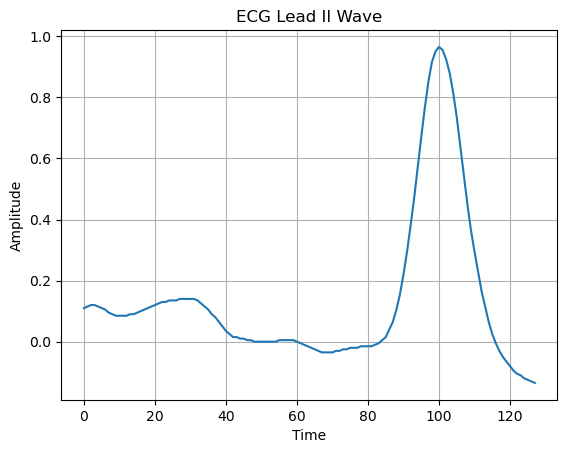

In [41]:
import matplotlib.pyplot as plt

# Tracer le signal ECG
plt.plot(ecg_values)
plt.title('ECG Lead II Wave')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()


In [48]:
# Essaie de traitement avec hl7apy, à faire plus tard

from hl7apy.parser import parse_segment, parse_field, parse_component
segment_msh = parse_segment(first_msh_segment)
print(segment_msh)

<Segment MSH>


In [47]:
# Trouver le début du premier segment MSH
start_index = content_file1.find('MSH')

# Trouver la fin du segment MSH (le début du prochain segment ou fin de chaîne)
end_index = content_file1.find('\n', start_index)

# Extraire le segment MSH
first_msh_segment = content_file1[start_index:end_index]

# Afficher le segment MSH extrait
print("Premier segment MSH extrait:")
print(first_msh_segment)


Premier segment MSH extrait:
MSH|^~\&|DATACAPTOR||||20240416152513||ORU^R01|4416152513078d02|P|2.3||||||8859/1|


In [58]:
# Lire et analyser le fichier HL7
with open(file_path1, 'r') as file:
    for line in file:
        line = line.strip()  # Nettoyer les espaces blancs de début et de fin
        if not line:
            continue  # Ignorer les lignes vides
        try:
            # Tenter d'analyser le message HL7
            parsed_message = parser.parse_message(line)
            # Afficher la structure du message HL7
            print(parsed_message)
        except Exception as e:
            # Afficher l'erreur et le message qui a causé l'erreur
            print(f"Error parsing message: {e}")
            print(f"Failed message content: {line}")
            
# La bibliothèque hl7apy lit partiellement le fichier, il faut peut-être faire un traitement des données avant

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT5|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152513|||LIT5|||LIT5|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||0.11^0.115^0.12^0.12^0.115^0.11^0.105^0.095^0.09^0.085^0.085^0.085^0.085^0.09^0.09^0.095^0.1^0.105^0.11^0.115^0.12^0.125^0.13^0.13^0.135^0.135^0.135^0.14^0.14^0.14^0.14^0.14^0.135^0.125^0.115^0.105^0.09^0.08^0.065^0.05^0.035^0.025^0.015^0.015^0.01^0.01^0.005^0.005^-0^-0^-0^-0^-0^-0^-0^0.005^0.005^0.005^0.005^0.005^-0^-0.005^-0.01^-0.015^-0.02^-0.025^-0.03^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.025^-0.025^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.01^-0.005^0.005^0.015^0.04^0.065^0.105^0.155^0.22^0.295^0.38^0.47^0.57^0.67^0.765^0.85^0.915^0.95^0.965^0.955^0.925^0.88^0.815^0.735^0.64^0.545^0.45^0.365^0.295^0.23^0.165^0.115^0.065^0.025^-0.005

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT14|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152517|||LIT14|||LIT14|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2326^2323^2316^2304^2290^2274^2257^2241^2225^2209^2194^2180^2167^2155^2143^2132^2121^2111^2102^2093^2085^2077^2069^2061^2052^2042^2032^2021^2011^2001^1990^1979|139|||||F||8.0036|20240416152517|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.03^-0.05^-0.065^-0.08^-0.09^-0.1^-0.105^-0.11^-0.115^-0.12^-0.12^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.12^-0.115^-0.11^-0.1^-0.095^-0.09^-0.085^-0.08^-0.075^-0.075^-0.07^-0.065^-0.06^-0.055^-0.055^-0.05^-0.05^-0.045^-0.045^-0.05^-0.05^-0.055^-0.06^-0.06^-0.065^-0.065^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.065^-

Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||-0.15^-0.15^-0.15^-0.145^-0.145^-0.145^-0.145^-0.145^-0.14^-0.135^-0.135^-0.13^-0.125^-0.125^-0.12^-0.12^-0.115^-0.11^-0.11^-0.11^-0.11^-0.105^-0.105^-0.105^-0.105^-0.105^-0.1^-0.1^-0.095^-0.095^-0.095^-0.095^-0.09^-0.09^-0.09^-0.09^-0.09^-0.09^-0.09^-0.09^-0.085^-0.085^-0.085^-0.085^-0.085^-0.09^-0.09^-0.095^-0.1^-0.1^-0.105^-0.11^-0.11^-0.115^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.105^-0.105^-0.105^-0.11^-0.11^-0.115^-0.12^-0.125^-0.135^-0.14^-0.15^-0.155^-0.16^-0.165^-0.17^-0.175^-0.175^-0.175^-0.18^-0.18^-0.18^-0.18^-0.175^-0.175^-0.17^-0.165^-0.155^-0.15^-0.14^-0.13^-0.125^-0.115^-0.105^-0.1^-0.09^-0.085^-0.08^-0.075^-0.065^-0.06^-0.055^-0.045^-0.04^-0.035^-0.03^-0.025^-0.02^-0.015^-0.015^-0.01^-0.01^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.01^-0.01^-0.015^-0.015^-0.015^-0.02^-0.02^-0.02^-0.02^-0.025^-0.025^-0.025^-0.025^-0.025^-0.

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.035^-0.035^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.045^-0.045^-0.045^-0.045^-0.045^-0.04^-0.04^-0.04^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.04^-0.045^-0.045^-0.05^-0.05^-0.055^-0.055^-0.055^-0.055^-0.055^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.055^-0.055^-0.055^-0.06^-0.06^-0.06^-0.065^-0.065^-0.065^-0.065^-0.065^-0.07^-0.07^-0.075^-0.075^-0.075^-0.08^-0.085^-0.085^-0.09^-0.09^-0.09^-0.09^-0.095^-0.095^-0.095^-0.095^-0.095^-0.09^-0.09^-0.09^-0.09^-0.09^-0.09^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.08^-0.08^-0.075^-0.075^-0.075^-0.075^-0.07^-0.065^-0.065^-0.06^-0.055^-0.05^-0.045^-0.04^-0.035^-0.03^-0.025^-0.02^-0.015^-0.015^-0.01^-0.005^-0^0.005^0.01^0.015^0.02^0.025^0.03^0.03^0.035^0.035^0.04^0.04^0.04^0.035^0.035^0.035^0.03^0.03^0.03^0.025^0.02^0.02^0.015^0.015^0.01|47|||||F||2.0009|20240416152526|
Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT7|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152531|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2003^1937^1875^1817^1764^1716^1673^1634^1598^1566^1536^1508^1482^1457^1432^1406^1381^1357^1333^1309^1285^1262^1239^1216^1192^1168^1144^1122^1106^1103^1121^1165|139|||||F||8.0036|20240416152531|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.115^0.115^0.115^0.11^0.11^0.105^0.1^0.095^0.09^0.08^0.07^0.06^0.055^0.05^0.045^0.045^0.045^0.04^0.04^0.035^0.035^0.03^0.025^0.02^0.015^0.015^0.01^0.005^-0^-0^-0.005^-0.005^-0.01^-0.01^-0.015^-0.015^-0.02^-0.02^-0.02^-0.025^-0.025^-0.02^-0.02^-0.02^-0.015^-0.01^-0.005^-0.005^-0^-0^0.005^0.005^0.005^-0^-0^-0.01^-0.015^-0.015^-0.02^-0.02^-0.02^-0.02^-0.015^-0.01^-0.005^-0^0.005^0.01^0

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT6|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152536|||LIT6|||LIT6|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2060^2030^2000^1971^1943^1916^1889^1862^1834^1807^1781^1755^1730^1706^1683^1661^1640^1618^1596^1575^1555^1535^1515^1495^1476^1458^1440^1422^1405^1389^1373^1357^1341^1325^1310^1295^1281^1267^1253^1240^1228^1217^1206^1194^1182^1170^1159^1150^1141^1133^1125^1117^1109^1101^1093^1084^1074^1065^1057^1049^1042^1035^1029^1023^1016^1009^1005^1005^1011^1026^1053^1096^1154^1227^1314^1411^1517^1629^1745^1862^1978^2092^2202^2308^2410^2507^2599^2685^2764^2836^2901^2959^3009^3050^3082^3105|139|||||F||8.0036|20240416152536|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.05^-0.05^-0.05^-0.045^-0.045^-0.045^-0.045^-0.045^-0.04^-0.04^-

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||0.035^0.04^0.04^0.045^0.045^0.05^0.05^0.055^0.055^0.06^0.065^0.065^0.07^0.07^0.06^0.055^0.05^0.05^0.045^0.045^0.045^0.045^0.045^0.045^0.05^0.05^0.055^0.055^0.05^0.05^0.045^0.04^0.035^0.035^0.035^0.035^0.04^0.045^0.045^0.055^0.06^0.06^0.06^0.06^0.06^0.06^0.06^0.06^0.065^0.065^0.065^0.065^0.07^0.07^0.075^0.075^0.075^0.075^0.075^0.07^0.07^0.07^0.075^0.075^0.08^0.075^0.08^0.085^0.085^0.075^0.075^0.07^0.07^0.065^0.065^0.065^0.07^0.075^0.085^0.09^0.095^0.105^0.105^0.105^0.1^0.095^0.095^0.09^0.09^0.09^0.09^0.095^0.095^0.1^0.105^0.105^0.1^0.1^0.095^0.095^0.095^0.1^0.1^0.11^0.115^0.12^0.125^0.135^0.135^0.13^0.135^0.13^0.125^0.12^0.115^0.11^0.115^0.11^0.105^0.11^0.105^0.1^0.1^0.09^0.085^0.08^0.075^0.07|47|||||F||2.0009|20240416152539|
Error parsing message: Invalid message
Failed message content: OBX|4|NA|8857||65.75^65.1875^64.75^64.375^64.0625^63.8125^63.5625^63.3125^63.0625^62.875^62.8125^63.3125^64.75^67.25^70.625^

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.06^0.065^0.065^0.065^0.06^0.055^0.045^0.035^0.025^0.01^-0^-0.015^-0.03^-0.045^-0.055^-0.07^-0.08^-0.09^-0.1^-0.11^-0.12^-0.13^-0.135^-0.14^-0.14^-0.145^-0.145^-0.145^-0.15^-0.15^-0.15^-0.155^-0.16^-0.165^-0.175^-0.18^-0.185^-0.185^-0.175^-0.155^-0.115^-0.06^0.01^0.1^0.205^0.32^0.445^0.57^0.7^0.815^0.915^0.985^1.02^1.015^0.975^0.905^0.805^0.685^0.55^0.4^0.26^0.13^0.025^-0.065^-0.125^-0.17^-0.2^-0.215^-0.22^-0.225^-0.22^-0.22^-0.215^-0.215^-0.215^-0.215^-0.215^-0.215^-0.215^-0.21^-0.21^-0.21^-0.21^-0.205^-0.205^-0.2^-0.2^-0.2^-0.2^-0.2^-0.2^-0.195^-0.195^-0.19^-0.185^-0.185^-0.18^-0.175^-0.17^-0.17^-0.165^-0.16^-0.155^-0.15^-0.145^-0.145^-0.14^-0.13^-0.125^-0.12^-0.115^-0.105^-0.1^-0.095^-0.085^-0.08^-0.07^-0.065^-0.055^-0.05^-0.045^-0.035^-0.03^-0.02^-0.015^-0.005^-0^0.01^0.015^0.025^0.03^0.035^0.045^0.05^0.05^0.055^0.06^0.06^0.06^0.055^0.055^0.055^0.055^0.05^0.05^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.

Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||-0.05^-0.045^-0.035^-0.03^-0.02^-0.01^-0^0.005^0.015^0.02^0.025^0.03^0.035^0.04^0.04^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.04^0.04^0.035^0.035^0.03^0.025^0.02^0.02^0.015^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.02^0.02^0.02^0.02^0.02^0.02^0.025^0.025^0.025^0.025^0.025^0.025^0.03^0.03^0.035^0.035^0.04^0.04^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.05^0.05^0.05^0.055^0.055^0.055^0.055^0.055^0.055^0.055^0.055^0.05^0.05^0.05^0.045^0.045^0.045^0.045^0.045^0.04^0.04^0.04^0.035^0.035^0.035^0.035^0.035^0.035^0.04^0.04^0.04^0.04^0.04^0.045^0.045^0.045^0.04^0.04^0.04^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.03^0.03^0.03^0.0

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||-0.105^-0.1^-0.085^-0.075^-0.06^-0.05^-0.035^-0.03^-0.03^-0.035^-0.04^-0.05^-0.06^-0.07^-0.075^-0.08^-0.08^-0.085^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.09^-0.09^-0.095^-0.095^-0.095^-0.1^-0.095^-0.09^-0.085^-0.08^-0.075^-0.065^-0.06^-0.055^-0.05^-0.045^-0.04^-0.035^-0.03^-0.025^-0.025^-0.02^-0.01^-0.01^-0.01^-0.005^-0.005^-0^0.005^0.005^0.005^0.005^-0^-0^-0.005^-0^0.005^0.015^0.025^0.03^0.04^0.045^0.045^0.04^0.03^0.02^0.01^-0.005^-0.015^-0.02^-0.02^-0.015^-0.005^0.01^0.02^0.035^0.04^0.04^0.03^0.025^0.015^0.01^-0^-0.005^-0.01^-0.01^-0.01^-0.005^-0^0.01^0.015^0.02^0.025^0.025^0.025^0.025^0.03^0.025^0.02^0.01^0.005^-0^-0.005^-0.015^-0.02^-0.025^-0.025^-0.03^-0.025^-0.025^-0.02^-0.015^-0.01^-0.01^-0.005^-0^-0^-0^0.005^0.005^0.01^0.01^0.005^0.005^-0^-0.005^-0.01^-0.015^-0.015^-0.02^-0.025^-0.02^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.01^-0.005^-0.01^-0.005^-0^0.005^0.01^0.015^0.015^0.015^0.01^-0^-0^-0.00

Error parsing message: Invalid message
Failed message content: OBX|4|NA|8857||81.4375^79.6875^78.5^77.8125^77.4375^77^76.5625^76^75.4375^74.9375^74.4375^73.9375^73.4375^72.875^72.375^71.9375^71.625^71.3125^71^70.6875^70.3125^70^69.625^69.25^68.875^68.4375^68.0625^67.75^67.375^67.0625^66.6875^66.375^66.0625^65.75^65.4375^65.125^64.8125^64.5^64.1875^63.875^63.625^63.3125^63.0625^62.75^62.4375^62.125^61.8125^61.5^61.1875^60.875^60.625^60.3125^60^59.75^59.4375^59.125^58.8125^58.5625^58.25^58.0625^57.875^57.75^57.875^58.625|9|||||F||8.0036|20240416152557|
Error parsing message: Invalid message
Failed message content: OBX|5|NA|8870||0.728327^0.730281^0.732234^0.734188^0.736142^0.738095^0.740049^0.742002^0.743956^0.74591^0.747863^0.749817^0.751282^0.75177^0.75177^0.75177^0.752259^0.752259^0.751282^0.750794^0.750794^0.751282^0.752259^0.753236^0.754212^0.755189^0.756654^0.757143^0.756654^0.753236^0.747863^0.740537|84|||||F||16.0072|20240416152557|
<Message ORU_R01>
Error parsing message: Invali

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT6|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152602|||LIT6|||LIT6|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2226^2198^2171^2145^2118^2090^2063^2037^2010^1982^1955^1930^1905^1881^1857^1833^1810^1787^1764^1741^1719^1697^1675^1653^1632^1611^1591^1571^1551^1532^1513^1494^1475^1457^1439^1422^1405^1389^1373^1358^1344^1330^1316^1302^1288^1275^1263^1251^1239^1227^1215^1204^1194^1184^1174^1165^1157^1149^1141^1133^1126^1119^1112^1105|139|||||F||8.0036|20240416152602|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.005^-0^0.005^0.015^0.015^0.02^0.025^0.025^0.03^0.03^0.03^0.035^0.035^0.035^0.035^0.04^0.045^0.045^0.05^0.05^0.05^0.05^0.05^0.05^0.05^0.045^0.045^0.04^0.035^0.03^0.025^0.02^0.01^0.005^-0^-0.01^-0.02^-0.025^-0.035^-0.04^-0.04

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.135^-0.13^-0.125^-0.12^-0.11^-0.105^-0.095^-0.09^-0.085^-0.075^-0.07^-0.065^-0.06^-0.055^-0.05^-0.045^-0.04^-0.04^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.035^-0.035^-0.04^-0.045^-0.045^-0.05^-0.05^-0.055^-0.06^-0.06^-0.065^-0.07^-0.07^-0.075^-0.075^-0.08^-0.08^-0.085^-0.085^-0.09^-0.09^-0.095^-0.095^-0.095^-0.095^-0.095^-0.09^-0.09^-0.09^-0.09^-0.085^-0.085^-0.08^-0.08^-0.075^-0.075^-0.075^-0.07^-0.07^-0.07^-0.065^-0.065^-0.065^-0.06^-0.06^-0.06^-0.055^-0.055^-0.055^-0.055^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.045^-0.045^-0.045^-0.04^-0.04^-0.035^-0.03^-0.025^-0.02^-0.015^-0.01^-0^0.005^0.01^0.02^0.025^0.035^0.04^0.045^0.055^0.06^0.065^0.07^0.075^0.085^0.09^0.09^0.095^0.1^0.1^0.1^0.105^0.105^0.1^0.1^0.095^0.09^0.085^0.08^0.07^0.06^0.05^0.045^0.035^0.02^0.01^-0^-0.01^-0.02^-0.03^-0.035^-0.045^-0.05^-0.06^-0.065^-0.065^-0.07^-0.07^-0.075^-0.075^-0.075^-0.075^-0.08^-0.085^-0.095^-0.1^-0.11

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||0.055^0.055^0.055^0.045^0.055^0.055^0.065^0.055^0.055^0.055^0.055^0.055^0.055^0.055^0.055^0.055^0.045^0.035^0.035^0.025^0.015^0.005^-0.005^-0.005^-0.015^-0.015^-0.025^-0.025^-0.025^-0.035^-0.035^-0.035^-0.045^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.005^0.005^0.015^0.025^0.035^0.055^0.075^0.095^0.115^0.145^0.185^0.225^0.265^0.305^0.345^0.385^0.435^0.465^0.505^0.535^0.545^0.555^0.565^0.565^0.535^0.495^0.435^0.355^0.265^0.175^0.085^-0.005^-0.095^-0.155^-0.205^-0.225^-0.235^-0.235^-0.205^-0.175^-0.135^-0.115^-0.085^-0.065^-0.045^-0.035^-0.035^-0.025^-0.025^-0.025^-0.025^-0.035^-0.035^-0.045^-0.035^-0.045^-0.035^-0.045^-0.045|47|||||F||2.0009|20240416152611|
Error parsing message: Invalid message
Failed

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.02^0.025^0.03^0.035^0.035^0.04^0.04^0.045^0.045^0.045^0.045^0.045^0.05^0.05^0.055^0.055^0.06^0.06^0.06^0.06^0.055^0.055^0.05^0.05^0.045^0.04^0.03^0.025^0.02^0.01^-0^-0.005^-0.015^-0.02^-0.03^-0.035^-0.04^-0.045^-0.045^-0.05^-0.05^-0.05^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.055^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.04^-0.04^-0.04^-0.035^-0.035^-0.03^-0.025^-0.02^-0.01^0.005^0.025^0.045^0.08^0.12^0.165^0.22^0.28^0.345^0.42^0.495^0.575^0.655^0.73^0.8^0.86^0.915^0.96^0.995^1.01^0.995^0.955^0.89^0.805^0.705^0.595^0.48^0.36^0.245^0.14^0.05^-0.01^-0.055^-0.08^-0.09^-0.095^-0.09^-0.085^-0.08^-0.075^-0.07^-0.07^-0.075^-0.075^-0.08^-0.085^-0.09^-0.095^-0.1^-0.1^-0.105^-0.105^-0.105^-0.105^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11

Error parsing message: Invalid message
Failed message content: OBX|5|NA|8870||-0.031697^-0.031697^-0.031697^-0.031697^-0.027399^-0.027399^-0.02525^-0.02525^-0.023101^-0.023101^-0.023101^-0.023101^-0.023101^-0.023101^-0.023101^-0.023101^-0.02525^-0.027399^-0.031697^-0.033846^-0.035995^-0.035995^-0.035995^-0.035995^-0.038144^-0.038144^-0.038144^-0.038144^-0.038144^-0.038144^-0.038144^-0.038144|84|||||F||16.0072|20240416152619|
<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT7|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152619|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1392^1357^1324^1295^1277^1278^1306^1369^1469^1601^1757^1926^2095^2254^2393^2508^2597^2662^2704^2728^2738^2737^2727^2709^2684^2651^2613^2569^2518^2460^2395^2324^2247^2167^2085^2002^1919^1840^1765^1696^1633^1578^1529^1486^1447^1412

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.175^-0.17^-0.17^-0.165^-0.16^-0.155^-0.15^-0.15^-0.15^-0.145^-0.145^-0.145^-0.14^-0.14^-0.14^-0.14^-0.135^-0.135^-0.135^-0.13^-0.13^-0.13^-0.13^-0.125^-0.125^-0.125^-0.125^-0.12^-0.115^-0.11^-0.11^-0.105^-0.105^-0.1^-0.1^-0.095^-0.095^-0.09^-0.09^-0.085^-0.085^-0.075^-0.07^-0.065^-0.06^-0.05^-0.045^-0.04^-0.03^-0.02^-0.015^-0.005^-0^0.005^0.01^0.015^0.02^0.02^0.02^0.02^0.02^0.015^0.015^0.015^0.015^0.02^0.02^0.02^0.02^0.02^0.015^0.01^0.01^-0^-0.005^-0.01^-0.02^-0.025^-0.03^-0.035^-0.035^-0.04^-0.04^-0.045^-0.045^-0.05^-0.05^-0.055^-0.055^-0.06^-0.065^-0.065^-0.07^-0.075^-0.075^-0.075^-0.075^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.07^-0.075^-0.075^-0.075^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.075^-0.075|47|||||F||2.0009|20240416152624|
Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||-0.005^0.005^-0.005^

Error parsing message: Invalid message
Failed message content: OBX|4|NA|8857||102^107.5625^112.6875^117.3125^121.1875^124.3125^126.6875^128.25^129.0625^129.1875^128.75^127.8125^126.375^124.625^122.5625^120.375^118^115.5^112.9375^110.3125^107.75^105.25^102.8125^100.5^98.375^96.5625^94.9375^93.625^92.5625^91.75^91.125^90.75^90.5^90.375^90.3125^90.3125^90.25^90.25^90.1875^90^89.8125^89.5625^89.25^88.9375^88.5^88.0625^87.625^87.1875^86.6875^86.25^85.8125^85.3125^84.875^84.375^83.9375^83.5^83.0625^82.625^82.25^81.8125^81.375^81^80.5625^80.25|9|||||F||8.0036|20240416152628|
Error parsing message: Invalid message
Failed message content: OBX|5|NA|8870||-0.033846^-0.035995^-0.038144^-0.038144^-0.038144^-0.038144^-0.038144^-0.038144^-0.038144^-0.038144^-0.033846^-0.033846^-0.031697^-0.031697^-0.029548^-0.029548^-0.027399^-0.027399^-0.02525^-0.02525^-0.023101^-0.023101^-0.020952^-0.020952^-0.018803^-0.018803^-0.018803^-0.018803^-0.016654^-0.016654^-0.016654^-0.016654|84|||||F||16.0072|20240416152

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT6|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152633|||LIT6|||LIT6|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1047^1040^1033^1030^1031^1040^1059^1092^1140^1204^1283^1375^1476^1583^1694^1804^1912^2017^2117^2211^2299^2381^2457^2525^2586^2640^2688^2730^2765^2793^2813^2826|139|||||F||8.0036|20240416152633|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025

Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152637|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2182^2106^2030^1956^1886^1822^1764^1712^1666^1625^1590^1559^1532^1506^1481^1458^1435^1413^1391^1369^1348^1327^1307^1287^1267^1247^1226^1203^1181^1164^1159^1176^1220^1297^1410^1553^1720^1900^2081^2252^2404^2533^2638^2720^2782^2827^2858^2876^2885^2887^2882^2870^2852^2828^2797^2758^2711^2658^2597^2531^2461^2388^2314^2241^2171^2106^2045^1989^1938^1892^1851^1814^1780^1749^1721^1694^1667^1641^1614^1587^1561^1534^1506^1478^1450^1421^1391^1362^1339^1329^1338^1373^1441^1543^1676^1833|139|||||F||8.0036|20240416152637|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.125^-0.12^-0.115^-0.11^-0.105^-0.105^-0.1^-0.1^-0.095^-0.095^-0.095^-0.095^-0.095^-0.09^-0.09^-0.09^-0.095^-0.095^-0.095^-0.1^-0.1^-0.105^-0.11^-0.115^-0.115^-0.12^-0.125^-0.13^-0.13^-0.135^-0.135^-0.135^-0.135^-0.135^-0.135^

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03|47|||||F||2.0009|20240416152642|
Error parsing message: Invalid message
Failed message content

Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||-0.155^-0.16^-0.165^-0.165^-0.17^-0.175^-0.175^-0.18^-0.185^-0.185^-0.19^-0.19^-0.19^-0.195^-0.195^-0.195^-0.19^-0.19^-0.185^-0.185^-0.175^-0.17^-0.165^-0.155^-0.15^-0.14^-0.135^-0.125^-0.115^-0.105^-0.1^-0.09^-0.08^-0.075^-0.065^-0.06^-0.055^-0.045^-0.04^-0.035^-0.03^-0.03^-0.025^-0.025^-0.025^-0.02^-0.02^-0.025^-0.025^-0.025^-0.03^-0.03^-0.035^-0.035^-0.035^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.045^-0.045^-0.045^-0.045^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.04^-0.04^-0.04^-0.045^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.045^-0.045^-0.04^-0.04^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.04^-0.04^-0.04^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.04^-0.04^-0.04^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.02^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.015^-0.015^-0.02^-0.02^-0.0

Error parsing message: Invalid message
Failed message content: OBX|4|NA|8857||78.875^78.3125^77.75^77.125^76.5625^76^75.4375^74.875^74.3125^73.75^73.3125^72.875^72.5^72.1875^71.875^71.5^71.1875^70.8125^70.4375^70.0625^69.625^69.25^68.875^68.5^68.125^67.75^67.375^67.0625^66.75^66.4375^66.0625^65.75^65.375^65^64.5625^64.1875^63.75^63.375^63^62.625^62.25^61.8125^61.4375^61.0625^60.6875^60.375^60^59.625^59.25^58.9375^58.625^58.3125^58^57.75^57.4375^57.1875^56.9375^56.625^56.375^56.125^55.875^55.625^55.375^55.1875^55.0625^54.9375^54.8125^54.6875^54.625^54.5625^54.5^54.375^54.5625^55.5^58^62.4375^68.25^74.0625^78.8125^82.1875^84.5625^86.6875^88.75^90.5625^92^92.875^93.5^93.875^94.125^94.1875^94^93.5625^92.9375^92.1875^91.1875^89.9375|9|||||F||8.0036|20240416152651|
Error parsing message: Invalid message
Failed message content: OBX|5|NA|8870||1.152259^1.155189^1.157143^1.159096^1.160073^1.16105^1.162027^1.163004^1.16398^1.16398^1.164469^1.16398^1.162027^1.159585^1.156654^1.153724^1.149817^1.1

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT14|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152656|||LIT14|||LIT14|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1624^1616^1608^1599^1591^1583^1573^1563^1556^1553^1557^1569^1588^1613^1645^1682^1723^1767^1812^1857^1902^1947^1994^2039^2081^2120^2155^2186^2213^2237^2256^2269^2278^2282^2282^2279^2274^2266^2256^2245^2234^2222^2210^2198^2186^2175^2165^2154^2142^2130^2118^2108^2100^2091^2083^2076^2069^2063^2056^2047^2038^2029^2021^2012|139|||||F||8.0036|20240416152656|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.04^0.035^0.03^0.02^0.015^0.015^0.02^0.02^0.025^0.03^0.035^0.04^0.04^0.035^0.03^0.025^0.02^0.015^0.015^0.01^0.015^0.015^0.02^0.025^0.025^0.03^0.03^0.03^0.025^0.025^0.02^0.015^0.015^0.015^0.015^0.02^0.02^0.02^0.025^0.025^0.

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||-0.035^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.025^-0.025^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.025^-0.025^-0.025^-0.025^-0.035^-0.035^-0.035^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015|47|||||F||2.0009|202404161

Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||-0.025^-0.01^0.01^0.035^0.07^0.115^0.17^0.235^0.315^0.4^0.49^0.58^0.67^0.755^0.83^0.88^0.91^0.915^0.9^0.865^0.815^0.75^0.67^0.585^0.49^0.405^0.33^0.26^0.195^0.14^0.09^0.045^0.01^-0.015^-0.035^-0.055^-0.07^-0.08^-0.09^-0.095^-0.105^-0.11^-0.12^-0.125^-0.13^-0.135^-0.14^-0.145^-0.145^-0.15^-0.15^-0.145^-0.145^-0.145^-0.145^-0.15^-0.15^-0.145^-0.145^-0.145^-0.145^-0.145^-0.14^-0.14^-0.135^-0.13^-0.13^-0.125^-0.12^-0.12^-0.115^-0.115^-0.11^-0.11^-0.105^-0.105^-0.105^-0.1^-0.1^-0.095^-0.095^-0.09^-0.09^-0.09^-0.09^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.08^-0.08^-0.08^-0.075^-0.07^-0.065^-0.055^-0.045^-0.035^-0.03^-0.03^-0.03^-0.03^-0.035^-0.045^-0.055^-0.065^-0.08^-0.09^-0.1^-0.105^-0.105^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.105^-0.105^-0.11^-0.11^-0.115^-0.115^-0.12^-0.12^-0.125^-0.13^-0.13^-0.135^-0.14^-0.145^-0.15^-0.15^-0.155^

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.02^-0.02^-0.02^-0.02^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.02^-0.02|47|||||F||2.0009|20240416152709|
Error parsing message: Invalid message
Failed mes

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.015^-0.02^-0.02^-0.015^-0^0.015^0.025^0.035^0.035^0.035^0.03^0.025^0.01^-0^-0.015^-0.025^-0.03^-0.03^-0.025^-0.015^-0^0.01^0.02^0.025^0.03^0.03^0.02^0.01^-0^-0.01^-0.02^-0.025^-0.025^-0.015^-0.005^0.01^0.025^0.035^0.04^0.045^0.04^0.035^0.03^0.02^0.01^-0^-0.005^-0.005^-0^0.01^0.02^0.03^0.035^0.04^0.04^0.03^0.02^0.01^-0.005^-0.015^-0.02^-0.025^-0.025^-0.02^-0.01^0.005^0.015^0.025^0.035^0.035^0.035^0.035^0.035^0.04^0.04^0.05^0.06^0.07^0.09^0.105^0.12^0.125^0.13^0.12^0.11^0.095^0.08^0.06^0.04^0.03^0.025^0.03^0.04^0.05^0.065^0.08^0.095^0.105^0.11^0.11^0.11^0.105^0.1^0.095^0.09^0.085^0.085^0.075^0.07^0.055^0.04^0.02^-0^-0.02^-0.04^-0.06^-0.075^-0.085^-0.085^-0.085^-0.08^-0.07^-0.06^-0.055^-0.05^-0.055^-0.06^-0.065^-0.08^-0.09^-0.095^-0.1^-0.1^-0.09^-0.075^-0.06^-0.045^-0.03^-0.02^-0.015^-0.015^-0.015^-0.02^-0.03^-0.04^-0.045^-0.045^-0.05^-0.045^-0.04^-0.035^-0.03^-0.025^-0.025^-0.025^-0.025^-0.03^-0.035^-0.035^-

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03

Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||-0.02^-0.02^-0.025^-0.025^-0.03^-0.03^-0.03^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.02^-0.02^-0.015^-0.015^-0.01^-0.01^-0.005^-0.005^-0.005^-0.01^-0.01^-0.01^-0.015^-0.02^-0.025^-0.025^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.02^-0.015^-0.015^-0.01^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.01^-0.015^-0.02^-0.02^-0.025^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.02^-0.02^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.01^-0.01^-0.005^-0.005^-0.005^-0.005^-0.005^-0^-0^-0^-0.005^-0.005^-0.005^-0.005^-0.01|47|||||F||2.0009|20240416152722|
Error parsing message: Invalid message
Failed message content: OBX|2|NA

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT7|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152726|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2908^3005^3120^3248^3379^3500^3596^3657^3681^3672^3641^3602^3565^3542^3538^3556^3598^3664^3751^3848^3933^3995^4035^4060^4075^4084^4089^4093^4095^4095^4095^4095|139|||||F||8.0036|20240416152726|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.035^0.03^0.03^0.025^0.02^0.02^0.02^0.025^0.03^0.035^0.04^0.045^0.05^0.06^0.07^0.08^0.09^0.095^0.1^0.11^0.12^0.125^0.135^0.14^0.145^0.15^0.15^0.15^0.145^0.145^0.145^0.145^0.145^0.145^0.145^0.14^0.135^0.13^0.125^0.115^0.105^0.095^0.08^0.065^0.05^0.04^0.025^0.02^0.01^0.005^-0^-0.005^-0.01^-0.015^-0.015^-0.015^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.015^-0.025^-0.04^-0.05^-0.06^-0.065^-

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||-0.045^-0.035^-0.035^-0.035^-0.035^-0.035^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.005^-0.005^-0.005^-0.005^0.005^0.005^0.005^0.015^0.015^0.015^0.015^0.025^0.025^0.025^0.025^0.015^0.015^0.015^0.025^0.025^0.025^0.025^0.025^0.025^0.025^0.025^0.025^0.015^0.025^0.025^0.015^0.015^0.015^0.025^0.015^0.015^0.005^0.005^0.015^0.005^0.005^-0.005^0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT5|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152735|||LIT5|||LIT5|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||-0^0.005^0.005^0.005^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.005^0.005^-0^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.015^-0.015^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.01^-0.01^-0.01^-0.01^-0.01^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0^-0^-0.005^-0.005^-0.01^-0.01^-0.015^-0.015^-0.02^-0.02^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.02^-0.015^-0.01^-0.01^-0.005^-0^0.005^0.005^0.005^0.005^0.005^-0^-0^-0.005^-0.005^-0.01^-0.01^-0.015^-0.015^-0.015^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.0

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.28^-0.295^-0.305^-0.315^-0.325^-0.33^-0.34^-0.35^-0.355^-0.365^-0.37^-0.375^-0.38^-0.38^-0.385^-0.385^-0.385^-0.38^-0.385^-0.39^-0.395^-0.405^-0.415^-0.425^-0.435^-0.435^-0.435^-0.42^-0.39^-0.345^-0.28^-0.2^-0.105^0.01^0.135^0.265^0.4^0.525^0.64^0.73^0.785^0.805^0.785^0.73^0.645^0.525^0.39^0.235^0.08^-0.065^-0.195^-0.3^-0.38^-0.44^-0.48^-0.5^-0.51^-0.51^-0.505^-0.5^-0.49^-0.485^-0.48^-0.48^-0.48^-0.475^-0.475^-0.475^-0.475^-0.475^-0.475^-0.47^-0.47^-0.47^-0.465^-0.465^-0.46^-0.46^-0.46^-0.46^-0.46^-0.46^-0.455^-0.455^-0.46^-0.46^-0.465^-0.465^-0.46^-0.46^-0.46^-0.46^-0.46^-0.455^-0.45^-0.445^-0.44^-0.44^-0.435^-0.43^-0.425^-0.42^-0.415^-0.405^-0.4^-0.39^-0.38^-0.37^-0.36^-0.345^-0.335^-0.325^-0.315^-0.305^-0.295^-0.29^-0.28^-0.27^-0.265^-0.26^-0.26^-0.265^-0.265^-0.27^-0.27^-0.28^-0.285^-0.29^-0.295^-0.3^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.3^-0.305^-0.31^-0.31^-0.315^-0

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT7|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152742|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2821^2880^2918^2939^2947^2943^2930^2908^2879^2845^2804^2756^2702^2641^2574^2501^2424^2344^2263^2182^2103^2030^1962^1900^1845^1796^1752^1714^1680^1649^1621^1595|139|||||F||8.0036|20240416152742|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.175^-0.17^-0.17^-0.17^-0.17^-0.17^-0.17^-0.17^-0.17^-0.17^-0.17^-0.17^-0.17^-0.17^-0.165^-0.165^-0.16^-0.16^-0.155^-0.155^-0.15^-0.15^-0.145^-0.145^-0.145^-0.14^-0.14^-0.14^-0.14^-0.135^-0.135^-0.135^-0.13^-0.125^-0.125^-0.12^-0.115^-0.11^-0.11^-0.105^-0.1^-0.095^-0.09^-0.085^-0.08^-0.075^-0.07^-0.065^-0.06^-0.055^-0.05^-0.04^-0.03^-0.025^-0.015^-0.005^0.005^0.01^0.02^0.03^0.035^0

Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.015^-0.01^-0^0.005^0.015^0.02^0.025^0.03^0.025^0.025^0.015^0.01^-0^-0.01^-0.02^-0.025^-0.035^-0.04^-0.04^-0.04^-0.04^-0.04^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.01^-0.01^-0.005^-0^0.005^0.01^0.015^0.02^0.02^0.02^0.015^0.01^-0^-0.005^-0.015^-0.02^-0.025^-0.03^-0.035^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.035^-0.035^-0.03^-0.025^-0.025^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.02^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.01^-0.01^-0.005^-0^0.005^0.01^0.01^0.015^0.02^0.02^0.02^0.015^0.01^-0^-0.005^-0.015^-0.02^-0.03^-0.035^-0.035^-0.04^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.01^-0.01^-0.01^-0.01^-0.01^

Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||-0.095^-0.095^-0.095^-0.095^-0.09^-0.09^-0.09^-0.09^-0.09^-0.09^-0.09^-0.09^-0.09^-0.085^-0.08^-0.075^-0.075^-0.07^-0.07^-0.075^-0.08^-0.085^-0.095^-0.105^-0.12^-0.13^-0.14^-0.15^-0.155^-0.16^-0.165^-0.17^-0.17^-0.175^-0.175^-0.175^-0.175^-0.175^-0.175^-0.18^-0.18^-0.18^-0.18^-0.18^-0.18^-0.18^-0.18^-0.175^-0.175^-0.165^-0.16^-0.15^-0.14^-0.13^-0.125^-0.115^-0.105^-0.1^-0.09^-0.075^-0.065^-0.055^-0.04^-0.03^-0.02^-0.015^-0.01^-0.005^-0.005^-0.01^-0.01^-0.015^-0.015^-0.015^-0.01^-0.01^-0.005^-0^0.005^0.005^0.01^0.01^0.005^0.005^0.005^-0^-0^-0^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0^0.005^0.01^0.015^0.02^0.025^0.025^0.03^0.03^0.03^0.025^0.015^0.01^-0^-0.005^-0.01^-0.015^-0.02^-0.02^-0.02|47|||||F||2.0009|20240416152750|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|8858||91.6875^97.625^104.8

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT6|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152752|||LIT6|||LIT6|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2716^2692^2668^2644^2620^2595^2570^2545^2520^2494^2469^2444^2418^2392^2366^2341^2317^2293^2268^2242^2217^2193^2169^2145^2121^2098^2075^2052^2029^2007^1984^1961^1940^1919^1899^1879^1859^1839^1820^1801^1783^1765^1747^1729^1711^1694^1677^1661^1645^1630^1615^1600^1584^1568^1553^1539^1525^1512^1499^1487^1476^1465^1454^1442|139|||||F||8.0036|20240416152752|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.005^-0.005^-0.005^-0^-0^0.005^0.01^0.015^0.02^0.025^0.03^0.035^0.04^0.04^0.045^0.05^0.05^0.05^0.055^0.055^0.06^0.06^0.065^0.065^0.07^0.07^0.075^0.075^0.075^0.07^0.07^0.07^0.065^0.06^0.055

Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2827^2761^2688^2609^2527^2442^2355^2270^2188^2110^2037^1971^1912^1859^1812^1768^1728^1693^1661^1630^1600^1572^1545^1519^1493^1467^1442^1416^1389^1362^1333^1302^1270^1243^1228^1233^1269^1341^1451^1596^1765^1946^2125^2290^2431^2546^2632^2692^2731^2753^2759^2753^2738^2715^2686^2650^2609^2563^2510^2449^2382^2308^2228^2144|139|||||F||8.0036|20240416152757|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.015^-0.005^0.005^0.01^0.02^0.025^0.03^0.03^0.035^0.035^0.04^0.045^0.05^0.06^0.07^0.08^0.09^0.1^0.105^0.115^0.12^0.125^0.13^0.13^0.13^0.125^0.125^0.12^0.12^0.12^0.12^0.125^0.125^0.125^0.125^0.125^0.13^0.135^0.135^0.135^0.135^0.135^0.13^0.13^0.125^0.125^0.12^0.115^0.11^0.105^0.1^0.095^0.095^0.09^0.09^0.09^0.085^0.085^0.085^0.085^0.085^0.085^0.09^0.09^0.09^0.085^0.085^0.085^0.085^0.085^0.085^0.085^0.085^0.085^0.09^0.09^0.095^0.1^0.1^0.1^0.1^0.1^0.1^0.095^0.095^0.095^0.095^0.095^0.095^0.

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||-0.135^-0.135^-0.155^-0.165^-0.175^-0.185^-0.215^-0.225^-0.235^-0.255^-0.265^-0.275^-0.285^-0.295^-0.305^-0.305^-0.305^-0.315^-0.315^-0.315^-0.315^-0.325^-0.325^-0.325^-0.335^-0.335^-0.335^-0.345^-0.345^-0.355^-0.365^-0.385^-0.385^-0.395^-0.395^-0.395^-0.405^-0.415^-0.405^-0.405^-0.405^-0.415^-0.405^-0.415^-0.415^-0.405^-0.415^-0.415^-0.415^-0.415^-0.415^-0.415^-0.415^-0.415^-0.415^-0.405^-0.405^-0.395^-0.385^-0.385^-0.375^-0.375^-0.365^-0.365^-0.355^-0.345^-0.355^-0.345^-0.345^-0.335^-0.335^-0.335^-0.325^-0.325^-0.325^-0.315^-0.315^-0.325^-0.315^-0.305^-0.305^-0.305^-0.305^-0.285^-0.285^-0.285^-0.285^-0.285^-0.285^-0.285^-0.295^-0.285^-0.285^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.285^-0.295^-0.295^-0.285^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.295^-0.305^-0.295^-0.295^-0.305^-0.295^-0.295^-0.295^-0.295^-0.295^-0.305^-0.305^-0.29

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT7|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152806|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1916^1884^1856^1831^1808^1785^1764^1742^1720^1699^1678^1656^1634^1611^1587^1561^1535^1514^1503^1511^1546^1613^1715^1848^2004^2172^2340^2498^2638^2755^2848^2917^2966^2997^3015^3021^3017^3005^2986^2960^2927^2887^2840^2786^2726^2660^2588^2512^2434^2356^2280^2207^2139^2077^2021^1971^1927^1888^1853^1822^1793^1767^1742^1716^1690^1665^1641^1617^1594^1571^1548^1523^1498^1472^1445^1420^1401^1396^1412^1457^1535^1645^1783^1940^2104^2264^2409^2533^2633^2709^2763^2798^2816^2821^2817^2804|139|||||F||8.0036|20240416152806|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.23^-0.23^-0.23^-0.225^-0.225^-0.225^-0.225^-0.225^-0.225^-0.22^

Error parsing message: Invalid message
Failed message content: OBX|4|NA|8857||50.375^50.25^50.1875^50.0625^49.9375^49.8125^49.6875^49.5625^49.4375^49.3125^49.25^49.125^49.0625^48.9375^48.875^48.75^48.625^48.5625^48.4375^48.3125^48.1875^48.0625^48^47.875^47.8125^47.6875^47.5625^47.4375^47.375^47.3125^47.25^47.1875^47.125^47.0625^47.125^47.125^47.125^47.125^47.125^47.3125^48^49.8125^53.25^58.375^64.375^70^74.5^77.875^80.75^83.4375^86.0625^88.375^90.0625^91.1875^91.9375^92.3125^92.5^92.5625^92.4375^92.0625^91.625^91.0625^90.4375^89.6875|9|||||F||8.0036|20240416152809|
Error parsing message: Invalid message
Failed message content: OBX|5|NA|8870||0.590598^0.655556^0.718071^0.778144^0.836264^0.89243^0.946642^0.998901^1.049695^1.098046^1.144444^1.186935^1.226496^1.265079^1.302686^1.338339^1.372039^1.40232^1.430159^1.456044^1.480464^1.5^1.5^1.5^1.5^1.5^1.5^1.5^1.5^1.5^1.5^1.5|84|||||F||16.0072|20240416152809|
<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.055^-0.055^-0.06^-0.06^-0.06^-0.06^-0.06^-0.065^-0.065^-0.065^-0.065^-0.07^-0.07^-0.07^-0.075^-0.075^-0.075^-0.075^-0.075^-0.08^-0.08^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.085^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.08^-0.075^-0.075^-0.075^-0.075^-0.07^-0.07^-0.065^-0.065^-0.06^-0.055^-0.055^-0.05^-0.045^-0.04^-0.035^-0.03^-0.025^-0.02^-0.015^-0.005^-0^0.005^0.01^0.015^0.015^0.02^0.025^0.03^0.03^0.035^0.035^0.035^0.035^0.04^0.04^0.04^0.04^0.04^0.045^0.045^0.045^0.045^0.045^0.045^0.045^0.04^0.04^0.04^0.04^0.04^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.035^0.03^0.03^0.03^0.025^0.025^0.025^0.025^0.025^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.025^0.025^0.025^0.025^0.025^0.025^0.025^0.025^0.025^0.025^0.03^0.03^0.03^0.03^0.03^0.035^0.035^0.04^0.04^0.045^0.045^0.05^0.

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||-0.01^-0.01^-0.01^-0.01^-0.01^-0.005^-0.005^-0.005^-0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.01^0.01^0.01^0.01^0.015^0.015^0.015^0.015^0.02^0.02^0.02^0.015^0.015^0.01^0.01^0.005^-0^0.005^0.005^0.005^0.01^0.015^0.02^0.02^0.025^0.025^0.02^0.015^-0^-0.005^-0.02^-0.03^-0.045^-0.055^-0.06^-0.07^-0.07^-0.075^-0.07^-0.075^-0.075^-0.08^-0.08^-0.08^-0.08^-0.075^-0.07^-0.065^-0.06^-0.05^-0.045^-0.035^-0.035^-0.035^-0.04^-0.045^-0.055^-0.07^-0.08^-0.095^-0.1^-0.11^-0.11^-0.1^-0.095^-0.085^-0.075^-0.07^-0.065^-0.06^-0.06^-0.06^-0.06^-0.065^-0.065^-0.065^-0.065^-0.05^-0.04^-0.03^-0.015^-0.005^-0^0.01^0.01^0.01^0.005^0.005^-0^-0^-0^0.005^0.01^0.02^0.03^0.04^0.045^0.045^0.04^0.035^0.025^0.02^0.01^0.005^-0.005^-0.005^-0^0.005^0.01^0.02^0.025^0.03^0.035^0.03^0.03^0.025^0.015^0.01^0.005^0.005^0.005^0.005^0.01^0.02^0.025^0.03^0.035^0.035^0.035^0.03^0.025^0.02^0.015^0.01^0.01^0.005^0.015^0.015^0.02^0.0

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.1^-0.1^-0.095^-0.085^-0.075^-0.07^-0.06^-0.06^-0.055^-0.055^-0.055^-0.06^-0.06^-0.06^-0.06^-0.055^-0.05^-0.04^-0.025^-0.01^0.005^0.015^0.025^0.035^0.04^0.04^0.04^0.03^0.025^0.015^0.01^0.01^0.01^0.015^0.025^0.035^0.04^0.05^0.055^0.06^0.06^0.06^0.055^0.05^0.04^0.035^0.03^0.025^0.025^0.025^0.025^0.03^0.035^0.045^0.05^0.06^0.065^0.07^0.075^0.08^0.08^0.075^0.07^0.06^0.05^0.04^0.03^0.025^0.02^0.015^0.015^0.025^0.03^0.04^0.05^0.055^0.06^0.055^0.05^0.045^0.035^0.03^0.025^0.02^0.02^0.025^0.03^0.03^0.03^0.03^0.03^0.03^0.025^0.02^0.015^0.01^0.005^0.005^0.005^0.01^0.01^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.01^0.015^0.015^0.02^0.02^0.025^0.03^0.035^0.035^0.035^0.03^0.025^0.015^0.01^0.005^-0.005^-0.005^-0.01^-0.01^-0.005^0.005^0.015^0.025^0.03^0.04^0.045^0.045^0.045^0.045^0.04^0.035^0.035^0.03^0.03^0.03^0.025^0.025^0.025^0.025^0.025^0.025^0.02^0.02^0.015^0.01^0.01^0.01^0.01^0.01^0.015^0.015^0.02^0.025^0.03^0.03^0.

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT5|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152826|||LIT5|||LIT5|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||0.005^0.005^0.005^0.005^0.005^0.005^0.005^-0^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.01^0.01^0.01^0.01^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.015^0.015^0.015^0.015^0.02^0.02^0.025^0.025^0.025^0.025^0.025^0.02^0.02^0.015^0.015^0.01^0.005^0.005^0.005^0.005^0.01^0.01^0.015^0.02^0.03^0.035^0.04^0.045^0.05^0.055^0.06^0.06^0.065^0.065^0.07^0.07^0.075^0.075^0.08^0.08^0.08^0.085^0.085^0.085^0.09^0.095^0.095^0.1^0.1^0.105^0.105^0.105^0.105^0.105^0.105^0.1^0.095^0.09^0.09^0.085^0.08^0.075^0.07^0.065^0.055^0.05^0.035^0.025^0.015^0.005^-0.005^-0.015^-0.025^-0.03^-0.035^-0.04^-0.0

Error parsing message: Invalid message
Failed message content: OBX|2|NA|8858||97.5^97^96.5625^96.125^95.6875^95.25^94.8125^94.4375^94^93.6875^93.3125^93^92.6875^92.3125^92^91.625^91.25^90.9375^90.5625^90.3125^90^89.75^89.5^89.25^88.9375^88.6875^88.4375^88.125^87.8125^87.5^87.1875^86.9375^86.6875^86.5^86.3125^86.125^85.9375^85.6875^85.375^85.0625^84.6875^84.375^84.125^83.9375^83.75^83.6875^83.5625^83.4375^83.3125^83.0625^82.75^82.4375^82.0625^81.75^81.4375^81.25^81.0625^80.875^80.75^80.625^80.4375^80.25^80.0625^79.875|9|||||F||8.0036|20240416152830|
Error parsing message: Invalid message
Failed message content: OBX|3|NA|8870||0.451404^0.456288^0.462149^0.468498^0.474847^0.480708^0.485592^0.489988^0.493895^0.497802^0.501221^0.504151^0.50757^0.511966^0.51685^0.521245^0.525153^0.528571^0.531502^0.533455^0.535409^0.536386^0.537363^0.538339^0.539316^0.540293^0.54127^0.544689^0.549084^0.554945^0.561783^0.56862|84|||||F||16.0072|20240416152830|
<Message ORU_R01>
Error parsing message: Invalid 

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT6|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152834|||LIT6|||LIT6|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2252^2226^2201^2177^2153^2129^2105^2081^2057^2034^2012^1990^1968^1947^1927^1907^1886^1864^1843^1822^1800^1780^1761^1743^1725^1706^1687^1669^1651^1634^1617^1601|139|||||F||8.0036|20240416152834|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.045^0.04^0.03^0.025^0.015^0.01^-0^-0.005^-0.015^-0.02^-0.025^-0.035^-0.035^-0.04^-0.04^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.045^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.02^-0.02^-0.015^-0.015^-0.005^0.005^0.02^0.045^0.075^0.11^0.15

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT14|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152839|||LIT14|||LIT14|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2591^2640^2688^2736^2783^2827^2865^2897^2924^2946^2965^2981^2992^2997^2998^2994^2985^2972^2954^2933^2910^2883^2853^2821^2789^2757^2725^2693^2662^2632^2603^2574|139|||||F||8.0036|20240416152839|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.005^0.01^0.015^0.015^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.015^0.015^0.015^0.015^0.015^0.01^0.01^0.01^0.005^0.005^0.01^0.01^0.01^0.01^0.01^0.015^0.015^0.02^0.02^0.02^0.02^0.015^0.015^0.015^0.015^0.01^0.01^0.01^0.01^0.01^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.01^0.01^0.005^0.005^-0^-0^-0^-0.005^-0.005^-0.01^-0.01^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0^-0^

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.035^-0.03^-0.025^-0.015^0.005^0.025^0.055^0.095^0.14^0.195^0.255^0.33^0.405^0.49^0.575^0.665^0.75^0.83^0.905^0.97^1.03^1.075^1.105^1.105^1.08^1.025^0.95^0.85^0.745^0.63^0.51^0.385^0.265^0.165^0.08^0.02^-0.02^-0.045^-0.06^-0.065^-0.07^-0.07^-0.07^-0.07^-0.07^-0.075^-0.08^-0.085^-0.09^-0.095^-0.1^-0.1^-0.105^-0.11^-0.11^-0.115^-0.115^-0.12^-0.12^-0.12^-0.12^-0.12^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.125^-0.12^-0.12^-0.12^-0.12^-0.12^-0.12^-0.12^-0.12^-0.12^-0.115^-0.115^-0.115^-0.115^-0.12^-0.12^-0.12^-0.12^-0.12^-0.12^-0.12^-0.12^-0.12^-0.115^-0.115^-0.115^-0.115^-0.115^-0.115^-0.115^-0.115^-0.115^-0.115^-0.115^-0.115^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.105^-0.105^-0.105^-0.105^-0.105^-0.105^-0.105^-0.105^-0.1^-0.1^-0.1^-0.1^-0.1^-0.095^-0.095^-0.095^-0.095^-0.095^-0.0

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT6|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152848|||LIT6|||LIT6|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1987^1972^1956^1940^1924^1908^1892^1877^1864^1850^1836^1822^1808^1794^1780^1767^1755^1743^1731^1719^1707^1696^1685^1674^1663^1653^1643^1634^1624^1613^1602^1590^1578^1567^1557^1547^1537^1527^1518^1508^1498^1489^1481^1476^1476^1484^1505^1542^1594^1662^1745^1842^1949^2062^2177^2293^2405^2512^2613^2709^2799^2883^2961^3034^3101^3162^3216^3262^3301^3334^3358^3376^3388^3393^3392^3384^3370^3351^3329^3304^3278^3252^3225^3198^3170^3143^3118^3093^3069^3045^3021^2997^2972^2945^2919^2893|139|||||F||8.0036|20240416152848|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.12^-0.12^-0.12^-0.115^-0.115^-0.115^-0.115^-0.115^-0.115^-0.115

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.075^0.075^0.07^0.065^0.055^0.045^0.035^0.03^0.03^0.03^0.03^0.03^0.025^0.025^0.02^0.02^0.015^0.015^0.015^0.01^0.01^0.005^0.005^0.01^0.015^0.02^0.025^0.03^0.03^0.03^0.035^0.035^0.035^0.03^0.025^0.015^0.01^0.005^0.005^0.01^0.015^0.02^0.025^0.025^0.025^0.025^0.025^0.02^0.02^0.015^0.015^0.015^0.015^0.02^0.03^0.035^0.04^0.04^0.04^0.04^0.04^0.035^0.035^0.035^0.03^0.025^0.025^0.02^0.025^0.025^0.035^0.035^0.035^0.035^0.035^0.03^0.025^0.02^0.015^0.01^0.005^0.005^0.01^0.015^0.015^0.02^0.025^0.03^0.035^0.03^0.015^0.005^-0.01^-0.02^-0.025^-0.025^-0.02^-0.015^-0.01^-0.005^-0^0.01^0.015^0.02^0.03^0.035^0.035^0.035^0.025^0.015^0.005^-0^-0.005^-0.01^-0.015^-0.02^-0.015^-0.01^-0^0.005^0.01^0.015^0.015^0.015^0.01^0.01^0.005^-0^-0^0.005^0.015^0.025^0.035^0.04^0.045^0.045^0.04^0.04^0.035^0.03^0.025^0.02^0.015^0.015^0.015^0.02^0.025^0.035^0.045^0.06^0.075^0.085^0.095^0.105^0.11^0.115^0.115^0.12^0.12^0.115^0.11^0.1^0.09^0.085^0.0

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT5|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152857|||LIT5|||LIT5|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^-0^-0^-0^-0^-0^-0^-0^-0^-0.005^-0.005^-0.01^-0.01^-0.01^-0.015^-0.015^-0.015^-0.015^-0.01^-0.01^-0.01^-0.005^-0.005^-0^-0^0.005^0.005^0.005^0.005^-0^-0^-0^-0.005^-0.005^-0.01^-0.01^-0.01^-0.015^-0.015^-0.015^-0.01^-0.01^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0^-0^-0^0.005^0.01^0.015^0.015^0.02^0.02^0.02^0.02^0.015^0.01^0.01^0.005^-0^-0^-0.005^-0.005^-0.005^-0.005^-0.005^-0.01^-0.01^-0.015^-0.015^-0.01^-0.01^-0.01^-0.01^-0.01^-0.005^-0.005^-0.005^-0^-0^-0^-0^-0^-0^-0^-0^-0^-0^-0.005^-0.005^-0.005^-0.005^-0.01^-0.01^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.01^-0.

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT7|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152901|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2697^2680^2655^2623^2583^2535^2479^2416^2348^2278^2207^2137^2069^2005^1946^1891^1842^1798^1758^1722^1690^1660^1633^1609^1586^1564^1544^1526^1508^1490^1473^1457^1440^1420^1399^1380^1367^1368^1389^1438^1517^1627^1762^1913^2071^2225^2367^2492^2597^2683^2750^2801^2840^2867^2885^2894^2894^2887^2875^2856^2828^2793^2751^2702|139|||||F||8.0036|20240416152901|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.19^0.195^0.195^0.2^0.205^0.205^0.21^0.215^0.22^0.225^0.23^0.235^0.24^0.245^0.25^0.255^0.26^0.27^0.275^0.28^0.29^0.295^0.305^0.31^0.32^0.325^0.33^0.335^0.345^0.35^0.355^0.355^0.36^0.365^0.365^0.37^0.37^0.37^0.37^0.37^0.37^0.3

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT5|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152905|||LIT5|||LIT5|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|5141||-0.165^-0.17^-0.175^-0.18^-0.185^-0.19^-0.195^-0.195^-0.2^-0.2^-0.205^-0.205^-0.205^-0.205^-0.205^-0.2^-0.2^-0.195^-0.19^-0.185^-0.18^-0.175^-0.17^-0.16^-0.155^-0.15^-0.145^-0.135^-0.13^-0.12^-0.11^-0.105^-0.095^-0.085^-0.08^-0.07^-0.06^-0.055^-0.045^-0.035^-0.03^-0.02^-0.015^-0.01^-0.005^-0.005^-0.005^-0.005^-0.005^-0.01^-0.01^-0.015^-0.02^-0.02^-0.02^-0.025^-0.02^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.025^-0.025^-0.025^-0.025^-0.025^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.01^-0.005^-0.005^-0^-0^0.00

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT14|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152909|||LIT14|||LIT14|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1951^1955^1964^1977^1995^2016^2038^2062^2089^2118^2146^2174^2200^2223^2244^2261^2276^2288^2296^2300^2301^2299^2293^2284^2271^2256^2240^2224^2208^2191^2174^2157^2141^2125^2110^2096^2083^2072^2061^2051^2042^2033^2024^2015^2008^1999^1990^1981^1972^1962^1953^1945^1938^1931^1925^1919^1912^1903^1893^1883^1873^1863^1854^1845|139|||||F||8.0036|20240416152909|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.025^0.01^-0.005^-0.015^-0.025^-0.04^-0.05^-0.055^-0.065^-0.075^-0.08^-0.085^-0.09^-0.09^-0.09^-0.09^-0.085^-0.085^-0.08^-0.075^-0.075^-0.07^-0.065^-0.06^-0.06^-0.06^-0.055^-0.055^-0.045^-0.04^-0.035^-0.025^-0.02^-0.015^-0

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.27^0.265^0.26^0.255^0.25^0.245^0.24^0.235^0.23^0.23^0.225^0.22^0.215^0.21^0.21^0.205^0.205^0.2^0.2^0.2^0.2^0.2^0.2^0.2^0.2^0.2^0.2^0.195^0.195^0.195^0.19^0.19^0.19^0.19^0.19^0.19^0.185^0.185^0.18^0.18^0.175^0.175^0.17^0.17^0.17^0.17^0.17^0.175^0.175^0.175^0.175^0.17^0.17^0.17^0.175^0.175^0.18^0.185^0.195^0.2^0.205^0.215^0.22^0.225^0.23^0.23^0.235^0.24^0.24^0.245^0.245^0.245^0.25^0.25^0.25^0.25^0.255^0.255^0.255^0.255^0.255^0.25^0.245^0.24^0.235^0.23^0.22^0.21^0.205^0.195^0.185^0.175^0.165^0.155^0.14^0.13^0.115^0.1^0.09^0.075^0.065^0.055^0.05^0.045^0.045^0.045^0.045^0.045^0.04^0.035^0.025^0.015^-0^-0.015^-0.025^-0.03^-0.03^-0.015^0.02^0.07^0.14^0.225^0.33^0.45^0.575^0.71^0.845^0.965^1.07^1.145^1.19^1.195^1.16^1.095^1^0.88^0.74^0.59^0.44^0.3^0.18^0.085^0.01^-0.04^-0.075^-0.1^-0.11^-0.115^-0.11^-0.105^-0.105^-0.1^-0.1^-0.1^-0.1^-0.095^-0.095^-0.095^-0.095^-0.09^-0.09^-0.09^-0.09^-0.09^-0.095^-0.095^-0.095^-0.0

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT14|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152918|||LIT14|||LIT14|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2225^2211^2195^2178^2162^2148^2135^2123^2111^2098^2084^2071^2059^2047^2035^2023^2010^1995^1980^1964^1947^1930^1913^1898^1885^1875^1865^1854^1841^1828^1815^1804|139|||||F||8.0036|20240416152918|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.05^-0.04^-0.035^-0.03^-0.03^-0.03^-0.035^-0.04^-0.05^-0.06^-0.07^-0.075^-0.075^-0.07^-0.07^-0.065^-0.065^-0.065^-0.07^-0.075^-0.085^-0.095^-0.105^-0.115^-0.125^-0.13^-0.13^-0.125^-0.12^-0.11^-0.095^-0.09^-0.08^-0.08^-0.08^-0.08^-0.085^-0.09^-0.095^-0.1^-0.1^-0.095^-0.09^-0.075^-0.06^-0.045^-0.03^-0.02^-0.015^-0.01^-0.015^-0.02^-0.03^-0.04^-0.045^-0.05^-0.05^-0.045^-0.03^-0.015^

Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1359^1356^1353^1349^1344^1338^1332^1327^1323^1319^1315^1311^1307^1303^1298^1292^1287^1284^1283^1286^1292^1302^1317^1338^1365^1399^1437^1479^1525^1575^1627^1679^1731^1783^1834^1882^1927^1968^2003^2035^2063^2087^2108^2125^2140^2152^2161^2169^2175^2177^2177^2175^2171^2167^2162^2155^2148^2140^2132^2125^2120^2115^2112^2109^2107^2106^2105^2105^2105^2105^2104^2100^2095^2091^2086^2079^2073^2067^2060^2052^2044^2035^2025^2015^2005^1996^1988^1980^1972^1963^1953^1943^1933^1923^1913^1903|139|||||F||8.0036|20240416152923|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.02^0.02^0.02^0.02^0.02^0.015^0.015^0.015^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.01^0.01^0.01^0.01^0.01^0.005^0.005^0.0

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.04^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.0

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.01^0.01^0.01^0.005^0.005^-0^-0^-0^-0^-0^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0^-0^-0^-0^-0^-0.005^-0.005^-0^-0^0.005^0.005^-0^-0^-0^-0^-0^-0.005^-0.005^-0.005^-0.01^-0.01^-0.01^-0.01^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0^-0^-0.005^-0.005^-0.005^-0^-0^-0^-0^0.005^-0^-0^-0^-0^-0^-0^-0^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.015^-0.015^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.02^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.015^-0.01^-0.01^-0.01^-0.01^-0.005^-0.01^-0.01^-0.005^-0.005^-0^-0.005^-0^-0^-0^0.005^-0^-0^-0^0.005^0.005^0.005^0.01^0.01^0

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^-0.005^-0.005^-0.005^-0.005^-0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^0.005^0.005^0.005^0.005^0.005^0.015^0.015^0.015^0.025^0.035^0.035^0.045^0.045^0.045^0.055^0.045^0.055^0.055^0.055^0.055^0.065^0.065^0.055^0.065^0.075^0.075^0.075^0.085^0.085^0.075^0.075^0.075^0.065^0.055^0.065^0.055^0.035^0.035^0.035^0.015^0.015^0.005^0.005^-0.005^-0.005^-0.005^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.005^-0.005^-0.005^0.005^0.015^0.025^0.035^0.055^0.075^0.105^0.135^0.175^0.205^0.245^0.295^0.335^0.375^0.425^0.475^0.515^0.545^0.575^0

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||-0.035^-0.035^-0.035^-0.035^-0.035^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^0.005^0.005^0.005^0.015^0.015^0.015^0.015^0.005^0.015^0.015^0.015^0.015^0.015^0.025^0.025^0.015^0.015^0.025^0.025^0.025^0.015^0.015^0.015^0.025^0.015^0.015^0.015^0.005^0.005^0.015^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^0.005^-0.005^-0.005^-0.005^-0.015^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.045^-0.045^-0.045^-0.045^-0.035^-0.035^-0.035^-0.035^-0.035^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.015^-0.015^-0

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT7|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152944|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1754^1729^1705^1681^1658^1636^1614^1592^1570^1547^1524^1499^1473^1450^1436^1438^1465^1525^1619^1746^1899^2067^2237^2398^2540^2659^2754^2824^2873^2904^2919^2922^2914^2898^2875^2846^2810^2768^2719^2663^2600^2531^2457^2378^2296^2214^2134^2057^1985^1918^1856^1800^1750^1705^1664^1626^1591^1559^1529^1499^1469^1440^1411^1384|139|||||F||8.0036|20240416152944|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.25^0.25^0.255^0.255^0.255^0.255^0.255^0.255^0.255^0.255^0.255^0.26^0.265^0.27^0.275^0.28^0.29^0.295^0.305^0.31^0.315^0.325^0.33^0.34^0.345^0.35^0.355^0.36^0.36^0.36^0.365^0.365^0.365^0.365^0.365^0.365^0.36^0.36^0.355^0.35^0.

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT14|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152948|||LIT14|||LIT14|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1803^1795^1779^1770^1762^1747^1738^1730^1719^1713^1708^1702^1695^1687^1678^1669^1662^1655^1649^1645^1641^1636^1631^1626^1618^1609^1600^1589^1579^1570^1563^1559^1555^1551^1548^1545^1542^1537^1532^1527^1522^1516^1512^1508^1503^1499^1494^1488^1483^1479^1475^1471^1468^1465^1463^1461^1457^1452^1447^1443^1440^1437^1435^1433^1430^1426^1422^1418^1413^1408^1402^1396^1392^1390^1389^1388^1385^1382^1378^1373^1368^1363^1360^1358^1357^1356^1353^1351^1350^1349^1349^1348^1345^1344^1345^1350|139|||||F||8.0036|20240416152948|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.03^-0.025^-0.02^-0.015^-0.01^-0.005^-0.005^-0.01^-0.015^-0.0

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT6|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152953|||LIT6|||LIT6|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1515^1497^1479^1462^1445^1429^1413^1397^1381^1366^1351^1337^1324^1311^1299^1287^1275^1263^1251^1240^1229^1219^1210^1201^1193^1185^1177^1169^1161^1152^1142^1133|139|||||F||8.0036|20240416152953|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.115^-0.115^-0.115^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.11^-0.105^-0.105^-0.105^-0.105^-0.105^-0.105^-0.105^-0.1^-0.1^-0.1^-0.1^-0.1^-0.1^-0.095^-0.095^-0.095^-0.095^-0.095^-0.09^-0.09^-0.09^-0.09^-0.085^-0.085^-0.085^-0.085^-0.08^-0.08^-0.08^-0.08^-0.075^-0.075^-0.075^-0.07^-0.0

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT14|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416152956|||LIT14|||LIT14|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2036^2022^2007^1993^1980^1967^1955^1943^1932^1921^1909^1895^1881^1867^1854^1842^1830^1818^1806^1793^1779^1764^1749^1736^1724^1714^1706^1700^1695^1691^1687^1683|139|||||F||8.0036|20240416152956|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.05^0.05^0.055^0.065^0.07^0.08^0.085^0.095^0.105^0.11^0.12^0.125^0.13^0.135^0.135^0.14^0.145^0.15^0.155^0.16^0.16^0.165^0.165^0.165^0.165^0.165^0.165^0.16^0.16^0.16^0.16^0.165^0.17^0.175^0.18^0.18^0.18^0.175^0.17^0.17^0.17^0.17^0.165^0.165^0.16^0.155^0.15^0.145^0.14^0.135^0.125^0.11^0.1^0.09^0.08^0.075^0.07^0.065^0.06^0.055^0.055^0.055^0.055^0.05^0.05^0.05^0.05^0.045^0.04^0.04^0.

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.62^-0.62^-0.625^-0.625^-0.625^-0.625^-0.62^-0.62^-0.62^-0.615^-0.615^-0.615^-0.61^-0.61^-0.605^-0.605^-0.6^-0.6^-0.6^-0.595^-0.595^-0.59^-0.59^-0.585^-0.585^-0.585^-0.58^-0.58^-0.58^-0.575^-0.57^-0.57^-0.565^-0.56^-0.555^-0.55^-0.545^-0.545^-0.54^-0.535^-0.535^-0.53^-0.53^-0.525^-0.52^-0.52^-0.515^-0.51^-0.5^-0.495^-0.49^-0.48^-0.47^-0.465^-0.455^-0.45^-0.44^-0.435^-0.425^-0.42^-0.415^-0.41^-0.405^-0.4^-0.395^-0.39^-0.385^-0.385^-0.38^-0.375^-0.375^-0.375^-0.37^-0.37^-0.37^-0.37^-0.37^-0.37^-0.375^-0.375^-0.38^-0.38^-0.385^-0.385^-0.39^-0.395^-0.395^-0.4^-0.405^-0.405^-0.41^-0.41^-0.415^-0.415^-0.42^-0.425^-0.425^-0.425^-0.425^-0.425^-0.425^-0.425^-0.425^-0.425^-0.42^-0.42^-0.415^-0.415^-0.41^-0.405^-0.405^-0.4^-0.395^-0.39^-0.385^-0.38^-0.375^-0.375^-0.37^-0.37^-0.37^-0.365^-0.365^-0.365^-0.365^-0.36^-0.365^-0.365^-0.365^-0.365^-0.37^-0.37^-0.375^-0.38^-0.38^-0.38^-0.38^-0.38^-0.38^-0.38^-0.375^-0.375^-0.

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT7|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416153006|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2328^2443^2543^2627^2695^2749^2792^2824^2847^2862^2869^2870^2862^2847^2825^2794^2755^2710^2658^2602^2542^2479^2416^2353^2293^2235^2179^2127^2079^2034^1992^1954^1918^1884^1853^1824^1795^1767^1739^1712^1685^1659^1633^1606^1578^1550^1523^1501^1488^1489^1511^1558^1632^1731^1850^1981^2115^2244^2362^2465^2553^2625^2681^2723^2754^2775^2789^2795^2794^2786^2771^2749^2719^2683^2640^2590^2535^2476^2413^2349^2285^2222^2161^2104^2050^2000^1954^1912^1873^1837^1804^1773^1744^1716^1689^1663|139|||||F||8.0036|20240416153006|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||1.055^1.075^1.055^1^0.915^0.805^0.675^0.535^0.385^0.245^0.12^0.02^

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||-0.005^-0.005^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^0.005^0.005^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.005^-0.005^-0.005^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.005^-0.005^-0.005^-0.005|47|||||F||2.0009|20240416153

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT7|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416153014|||LIT7|||LIT7|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||2581^2516^2449^2383^2319^2258^2201^2149^2100^2054^2012^1974^1940^1909^1880^1851^1824^1797^1771^1746^1721^1697^1673^1648^1621^1595^1572^1556^1553^1570^1612^1682|139|||||F||8.0036|20240416153014|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.105^0.1^0.1^0.095^0.09^0.09^0.085^0.08^0.075^0.07^0.065^0.065^0.06^0.055^0.05^0.045^0.045^0.04^0.035^0.035^0.03^0.03^0.025^0.02^0.02^0.02^0.015^0.015^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.01^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.015^0.01^0.01^0.01^0.01^0.01^0.005^0.005^0.005^0.005^0.01^0.01^0.015^0.02^0.025^0.03^0.035^0.04^0.045^

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT14|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416153019|||LIT14|||LIT14|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1724^1719^1715^1711^1707^1704^1701^1697^1691^1684^1676^1669^1665^1663^1664^1668^1676^1690^1709^1733^1762^1795^1834^1877^1923^1969^2014^2057^2099^2139^2175^2208^2239^2268^2293^2315^2333^2347^2357^2363^2366^2366^2364^2360^2354^2346^2337^2329^2321^2313^2305^2298^2292^2286^2279^2273^2267^2260^2254^2250^2247^2246^2245^2244^2242^2240^2236^2230^2223^2216^2208^2200^2191^2183^2176^2167^2158^2150^2143^2136^2126^2114^2102^2092^2086^2083^2084^2089^2100^2115^2134^2155^2180^2208^2237^2266|139|||||F||8.0036|20240416153019|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||0.005^0.01^0.01^0.01^0.015^0.015^0.015^0.015^0.015^0.015^0.015^

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.065^-0.065^-0.07^-0.065^-0.055^-0.045^-0.03^-0.02^-0.015^-0.015^-0.015^-0.02^-0.03^-0.04^-0.055^-0.065^-0.075^-0.08^-0.075^-0.07^-0.065^-0.055^-0.045^-0.04^-0.035^-0.035^-0.04^-0.05^-0.06^-0.07^-0.085^-0.09^-0.095^-0.095^-0.095^-0.085^-0.08^-0.07^-0.065^-0.055^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.05^-0.045^-0.045^-0.04^-0.035^-0.03^-0.025^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.01^-0.005^-0^0.01^0.02^0.025^0.035^0.04^0.04^0.04^0.04^0.035^0.03^0.025^0.02^0.015^0.015^0.02^0.03^0.035^0.045^0.05^0.055^0.06^0.065^0.065^0.07^0.07^0.07^0.065^0.055^0.045^0.035^0.025^0.015^0.015^0.01^0.01^0.01^0.015^0.025^0.03^0.04^0.05^0.05^0.055^0.05^0.045^0.04^0.035^0.03^0.03^0.03^0.035^0.04^0.045^0.05^0.045^0.045^0.04^0.035^0.03^0.02^0.015^0.01^0.005^0.005^0.01^0.015^0.02^0.025^0.03^0.035^0.035^0.03^0.03^0.025^0.015^0.01^0.005^-0^0.005^0.005^0.015^0.02^0.025^0.03^0.035^0.035^0.035^0.035^0.025^0.02^0.01^0.005^0.005^0.01^0.0

<Message ORU_R01>
Error parsing message: Invalid message
Failed message content: PID|
Error parsing message: Invalid message
Failed message content: PV1||I|LIT14|
Error parsing message: Invalid message
Failed message content: OBR|||||||20240416153028|||LIT14|||LIT14|
Error parsing message: Invalid message
Failed message content: OBX|1|NA|113||1875^1866^1858^1852^1846^1840^1835^1831^1825^1817^1809^1801^1793^1786^1779^1773^1768^1762^1755^1747^1738^1729^1722^1715^1708^1701^1696^1691^1686^1679^1672^1663^1654^1645^1639^1638^1641^1649^1664^1685^1712^1744^1781^1824^1870^1916^1961^2006^2050^2092^2131^2168^2216^2244^2268^2305^2319^2329^2340^2340^2336^2323^2315^2304^2286^2273^2261^2251^2242^2233^2226^2220^2215^2212^2209^2207^2205^2202^2197^2191^2184^2176^2168^2160^2153^2147^2140^2131^2122^2113^2104^2092^2079^2068^2057^2045|139|||||F||8.0036|20240416153028|
Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.1^-0.1^-0.105^-0.105^-0.105^-0.105^-0.105^-0.105^-0.105^-0.1

Error parsing message: Invalid message
Failed message content: OBX|3|NA|5142||0.015^0.01^0.01^0.015^0.015^0.01^0.01^0.005^0.005^0.005^-0^-0^0.005^0.005^0.005^0.01^0.01^0.015^0.015^0.02^0.015^0.02^0.015^0.02^0.015^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.02^0.025^0.025^0.02^0.02^0.02^0.015^0.015^0.015^0.015^0.015^0.01^0.01^0.005^0.005^-0^-0^0.005^0.005^0.005^0.01^0.01^0.01^0.01^0.005^0.005^0.005^0.005^0.005^0.005^-0^-0^-0^-0^-0^-0^-0^-0^-0^-0^-0.005^-0.005^-0.005^-0.01^-0.01^-0.015^-0.015^-0.015^-0.015^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.015^-0.02^-0.02^-0.01^-0.01^-0.01^-0.01^-0.01^-0.005^-0.005^-0^-0^-0^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.01^-0.01^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.015^-0.015^-0.015^-0.015^-0.01^-0.01^-0.01^-0.01^-0.01^-0.005^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.01^-0.015^-0.015^-0.015^-0.02^-0.02^-0.02^-0.0

Error parsing message: Invalid message
Failed message content: OBX|2|NA|5141||-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.035^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.02^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.03^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025^-0.025|47|||||F||2.0009|20240416153036|
Error parsing message: Invalid message


Error parsing message: Invalid message
Failed message content: OBX|4|NA|8857||100.0625^95.75^92^88.8125^86.1875^84.125^82.5625^81.5^80.875^80.6875^80.75^81^81.375^81.6875^81.9375^82.0625^82.0625^81.8125^81.4375^80.8125^80.125^79.3125^78.5^77.625^76.8125^76.0625^75.375^75.0625^75.5625^78.125^83.9375^93.5625^106.5^121.375^136.6875^151.4375^164.8125^176.3125^185.3125^191.625^195.0625^195.75^193.875^189.6875^183.875^176.9375^169.625^162.4375^155.625^149.3125^143.625^138.375^133.375^128.625^123.8125^119^114.1875^109.4375^104.9375^100.875^97.25^94.1875^91.5625^89.5^88^86.9375^86.25^86^86^86.1875^86.5^86.8125^87^87.125^87^86.75^86.3125^85.6875^84.875^84^83^82^81.0625^80.1875^79.5625^79.75^82^87.4375^96.875^109.625^124.4375^139.8125^154.6875^168.125^179.5^188.3125|9|||||F||8.0036|20240416153040|
Error parsing message: Invalid message
Failed message content: OBX|5|NA|8870||0.837118^0.842002^0.85116^0.862759^0.87619^0.889621^0.903053^0.915263^0.926252^0.933578^0.937851^0.938462^0.93602^0.926862^

In [63]:
def extract_information(segment):
    parts = segment.split('|')
    if parts[0] == 'OBX':
        # Par exemple, extraire certaines informations d'un segment OBX
        print("Type:", parts[2])
        print("Value:", parts[5])
    

with open(file_path1, 'r') as file:
    for line in file:
        line = line.strip()  # Nettoyer les espaces blancs de début et de fin
        if line:
            print(f"Processing Line: {line}")
            extract_information(line)
        else:
            print("Empty or malformed line detected")

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [2]:
file_path = r"D:\stage\data\EXEMPLE1_CAPSULE_HL7_WAVEFORM\CAPSULE_exemple HL7 5 waveform Saint Denis.txt"

# Ouvrir le fichier et lire les lignes une par une
with open(file_path, 'r') as file:
    lines = file.readlines()

# Afficher les premières lignes pour comprendre la structure
for line in lines[:10]:
    print(line)


MSH|^~\&|DATACAPTOR||||20221027140215||ORU^R01|2a27140215385841|P|2.3||||||8859/1|

PID|

PV1||I|CH2|

OBR|||||||20221027140214|||CH2|||CH2|

OBX|1|NA|113||2749^2803^2853^2899^2939^2975^3005^3029^3048^3062^3070^3072^3068^3059^3045^3026^3002^2973^2939^2902^2860^2816^2768^2717^2664^2609^2553^2495^2437^2379^2320^2263^2206^2150^2096^2043^1993^1945^1899^1856^1816^1779^1746^1715^1687^1663^1641^1623^1607^1594^1583^1575^1569^1565^1562^1561^1561^1562^1563^1565^1566^1568^1568^1568|139|||||F||8.0036|20221027140214|





MSH|^~\&|DATACAPTOR||||20221027140215||ORU^R01|2a27140215386851|P|2.3||||||8859/1|

PID|

PV1||I|CH2|



In [3]:
for line in lines:
    if line.startswith('MSH'):
        segments = line.split('|')
        print(segments)  # Affiche les différents segments pour une ligne qui commence par 'MSH'


['MSH', '^~\\&', 'DATACAPTOR', '', '', '', '20221027140215', '', 'ORU^R01', '2a27140215385841', 'P', '2.3', '', '', '', '', '', '8859/1', '\n']
['MSH', '^~\\&', 'DATACAPTOR', '', '', '', '20221027140215', '', 'ORU^R01', '2a27140215386851', 'P', '2.3', '', '', '', '', '', '8859/1', '\n']
['MSH', '^~\\&', 'DATACAPTOR', '', '', '', '20221027140215', '', 'ORU^R01', '2a27140215386861', 'P', '2.3', '', '', '', '', '', '8859/1', '\n']
['MSH', '^~\\&', 'DATACAPTOR', '', '', '', '20221027140215', '', 'ORU^R01', '2a27140215386871', 'P', '2.3', '', '', '', '', '', '8859/1', '\n']
['MSH', '^~\\&', 'DATACAPTOR', '', '', '', '20221027140215', '', 'ORU^R01', '2a27140215567881', 'P', '2.3', '', '', '', '', '', '8859/1', '\n']
['MSH', '^~\\&', 'DATACAPTOR', '', '', '', '20221027140215', '', 'ORU^R01', '2a27140215567891', 'P', '2.3', '', '', '', '', '', '8859/1', '\n']
['MSH', '^~\\&', 'DATACAPTOR', '', '', '', '20221027140215', '', 'ORU^R01', '2a271402155678a1', 'P', '2.3', '', '', '', '', '', '8859/1'

In [4]:
data_extracted = []
for line in lines:
    if line.startswith('MSH'):
        segments = line.split('|')
        # Exemple: extraire une partie spécifique, ajustez l'index selon vos besoins
        data_extracted.append({
            'type': segments[0],
            'date': segments[3],
            'value': segments[5]
        })

# Convertir en DataFrame pour une manipulation plus facile avec pandas
import pandas as pd
df = pd.DataFrame(data_extracted)
print(df.head())


  type date value
0  MSH           
1  MSH           
2  MSH           
3  MSH           
4  MSH           


In [5]:
obx_data = []
for line in lines:
    if line.startswith('OBX'):
        segments = line.strip().split('|')
        # Supposons que le 6ème champ est la valeur de l'observation
        obx_data.append({
            'Observation Identifier': segments[3],  # Identifier
            'Observation Value': segments[5]  # Valeur de l'observation
        })

# Convertir en DataFrame
obx_df = pd.DataFrame(obx_data)
print(obx_df.head())


  Observation Identifier                                  Observation Value
0                    113  2749^2803^2853^2899^2939^2975^3005^3029^3048^3...
1                   5141  -0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.0...
2                   5142  -0.005^-0.005^-0.005^-0.005^-0.005^-0.005^-0.0...
3                   8857  100^98.5625^97.25^96.0625^94.875^93.6875^92.56...
4                   8870  0.016825^0.017143^0.01746^0.01746^0.017778^0.0...


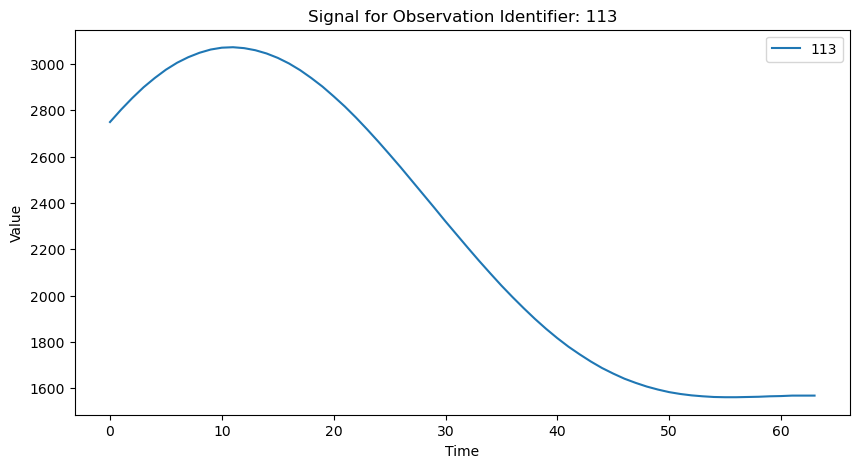

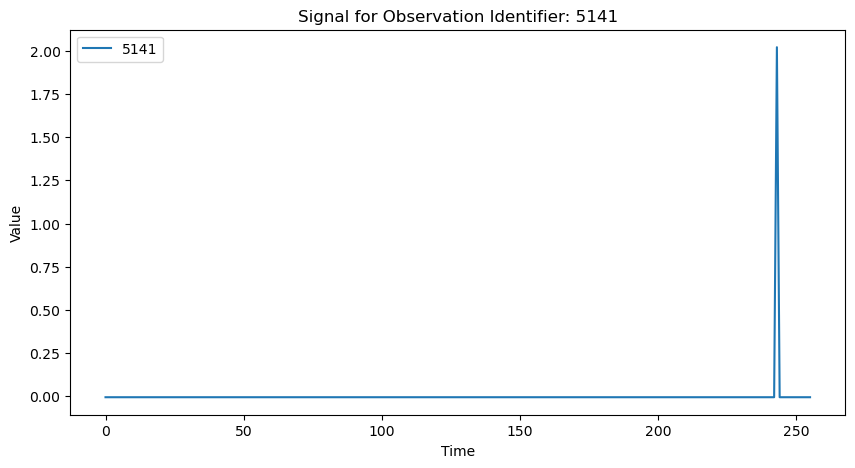

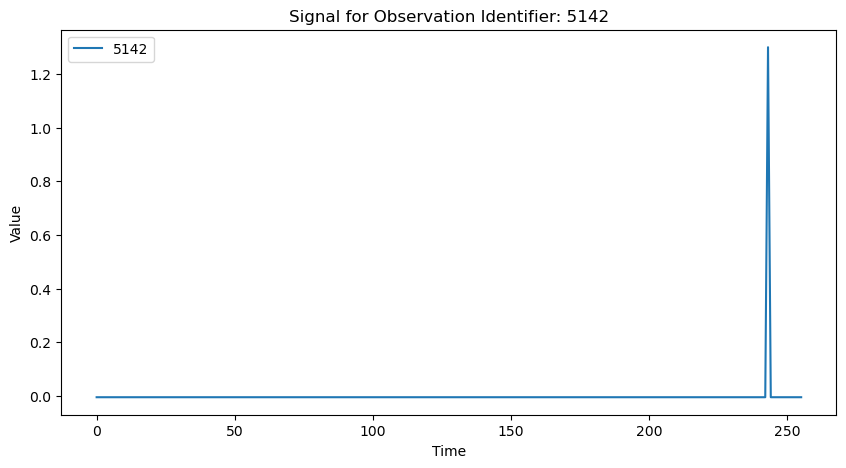

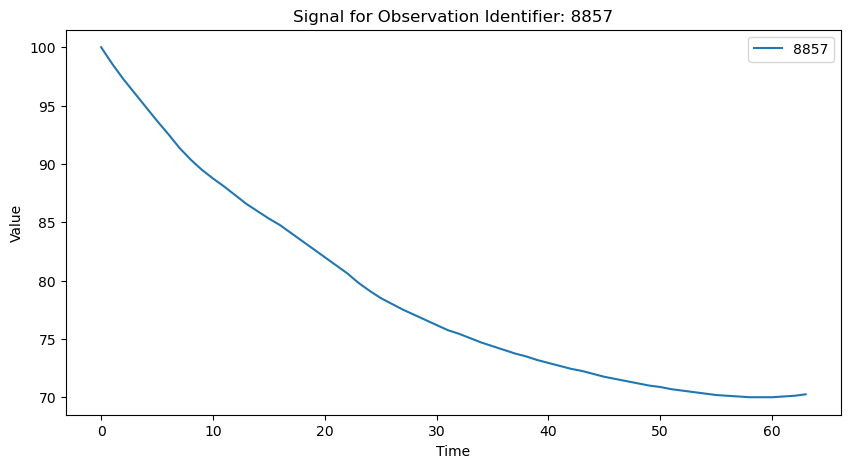

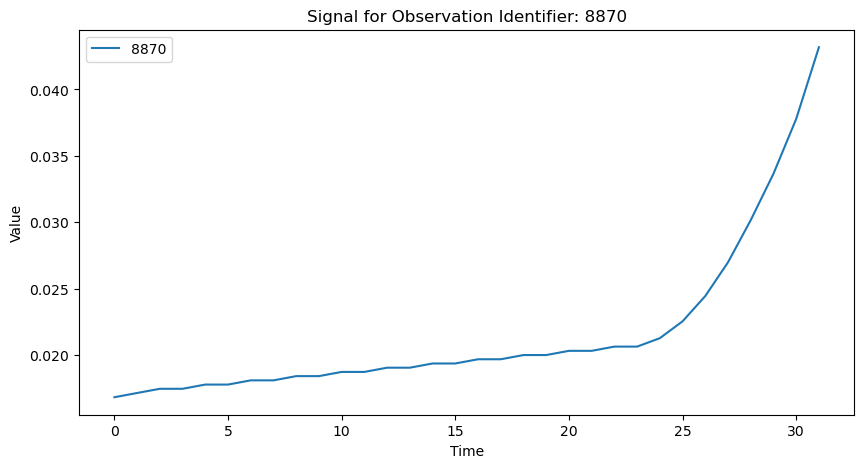

...

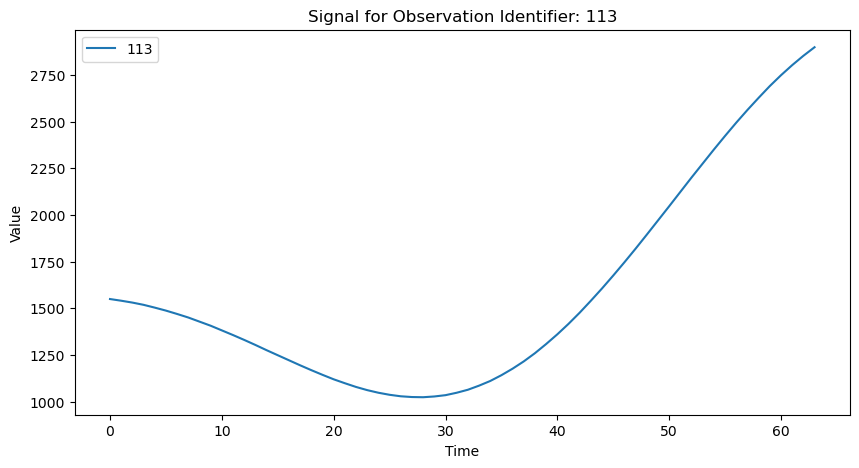

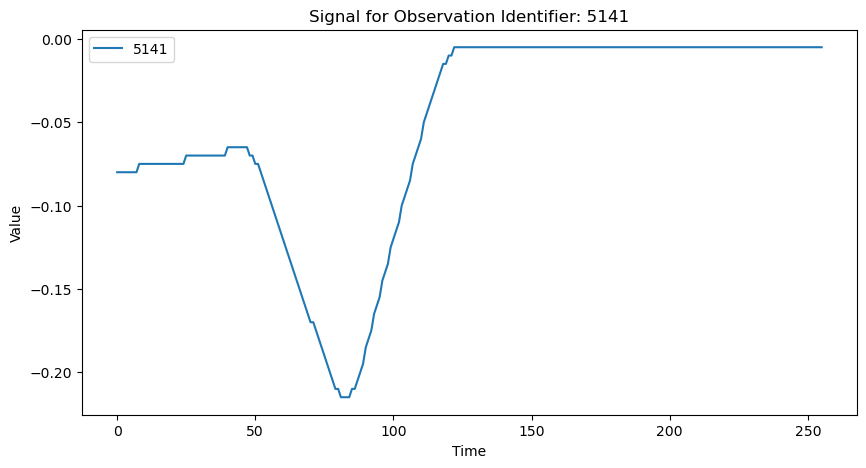

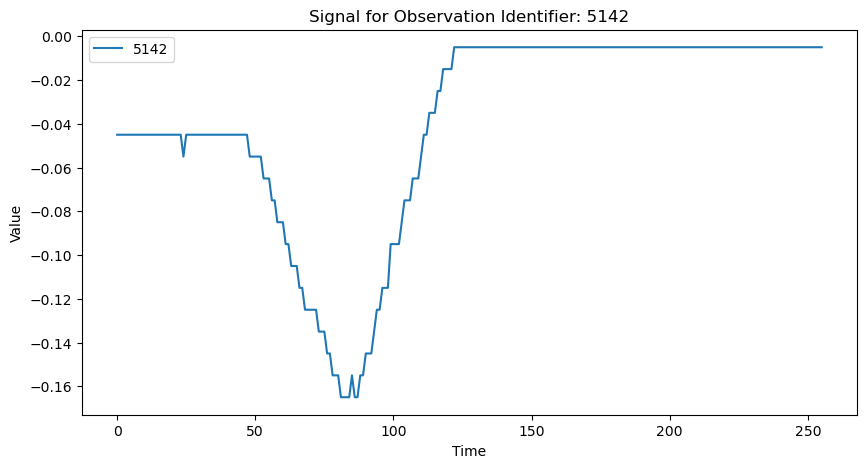

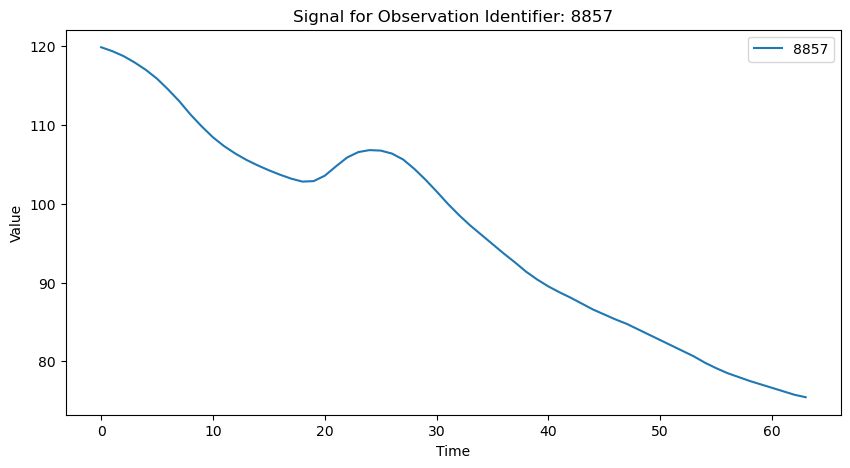

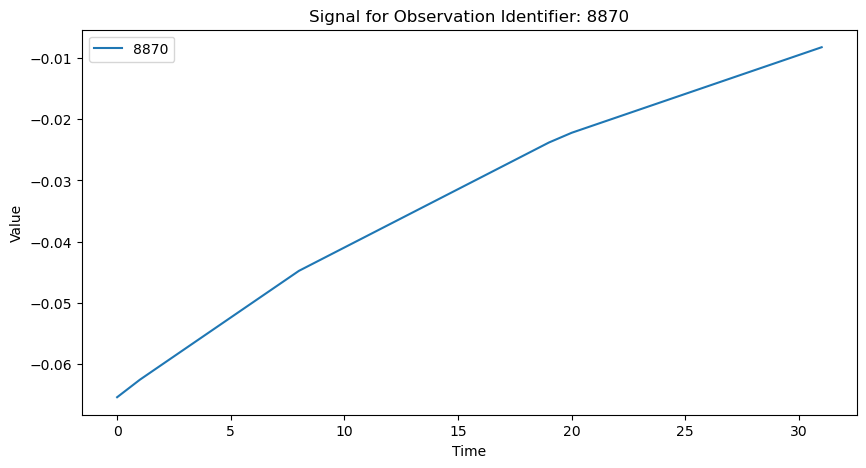

In [8]:
import matplotlib.pyplot as plt

# Function to plot signals
def plot_obx_signals(df):
    for idx, row in df.iterrows():
        identifier = row['Observation Identifier']
        values = row['Observation Value'].split('^')
        values = list(map(float, values))  # Convert string values to float
        plt.figure(figsize=(10, 5))
        plt.plot(values, label=identifier)
        plt.title(f"Signal for Observation Identifier: {identifier}")
        plt.xlabel('Time')
        plt.ylabel('Value')
        plt.legend()
        plt.show()

# Plot the signals
plot_obx_signals(obx_df)

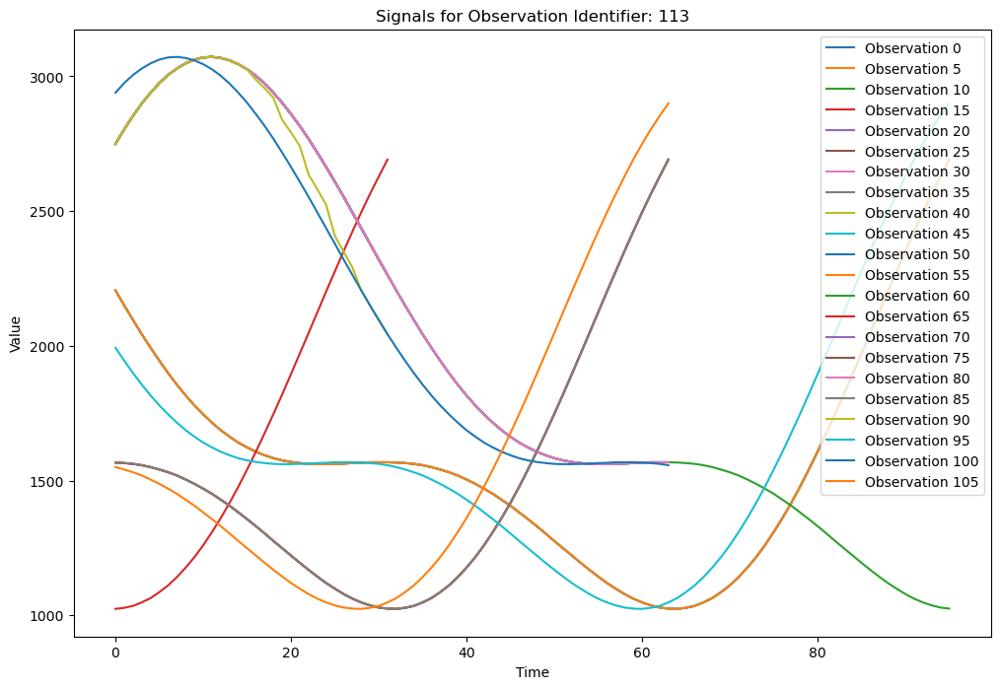

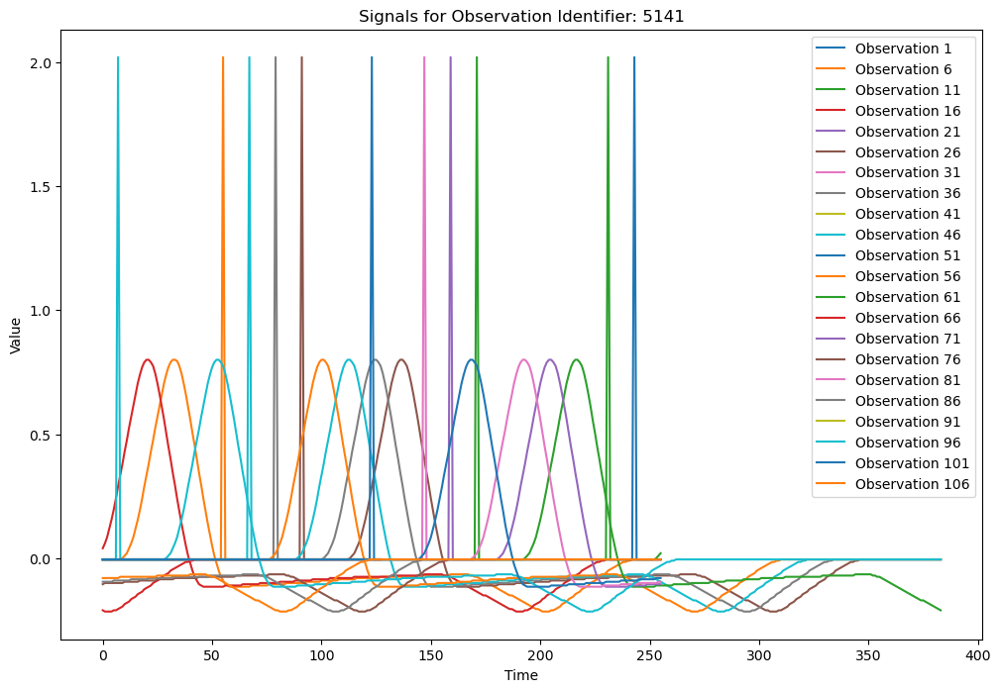

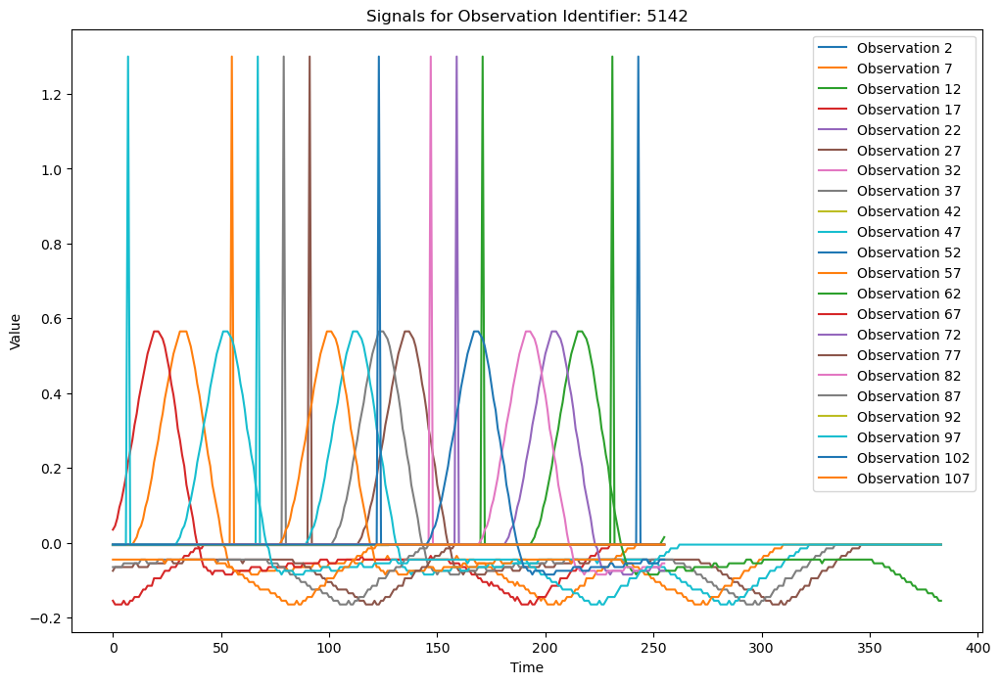

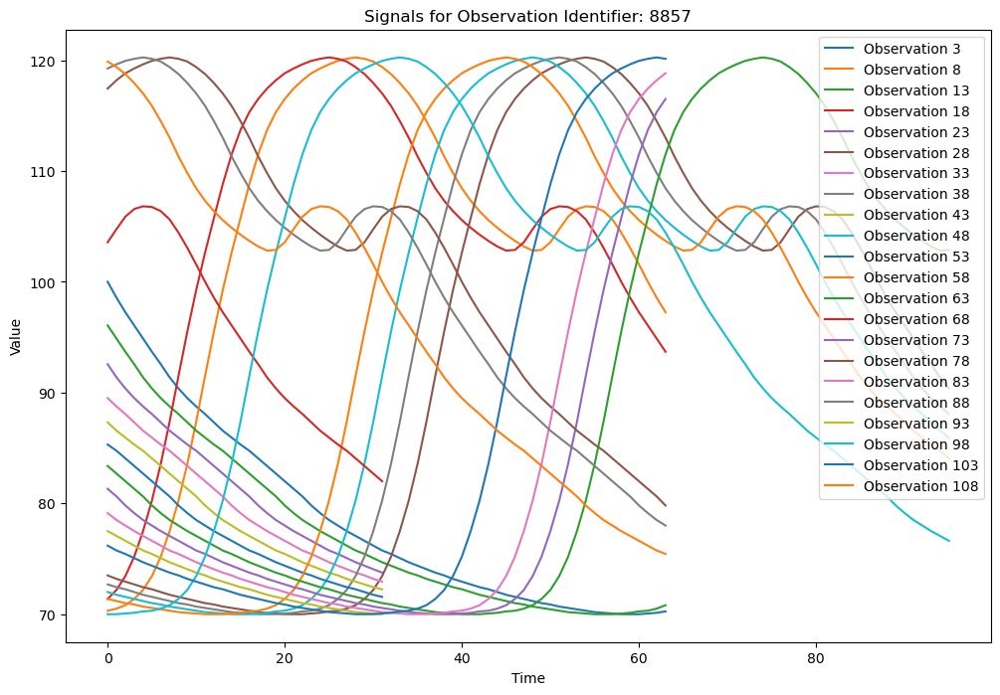

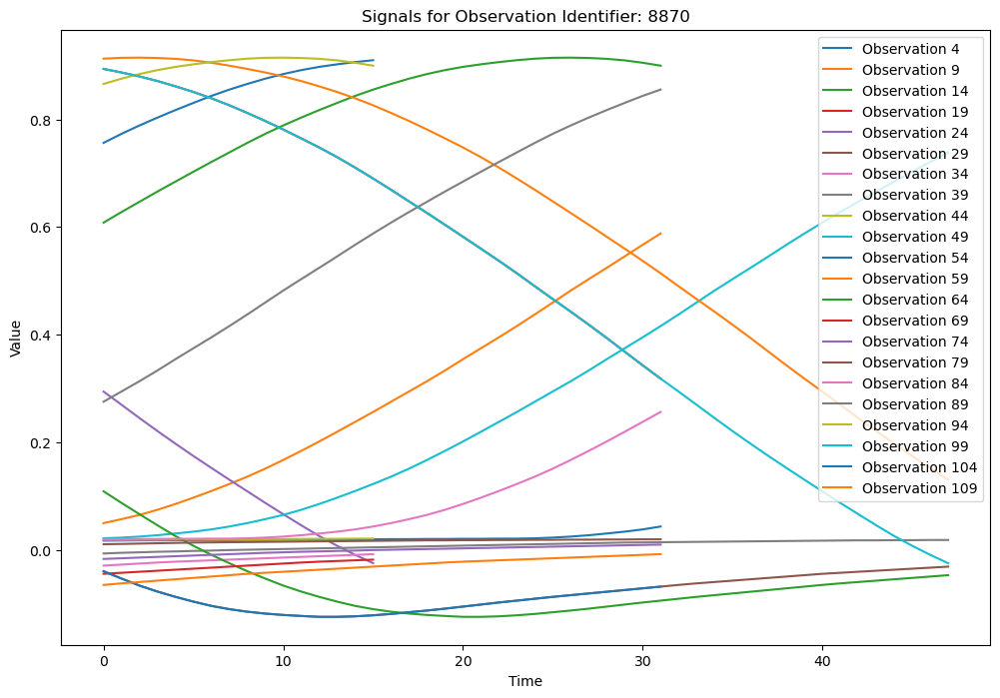

In [10]:
# Function to group by Observation Identifier and plot signals
def plot_obx_signals_by_identifier(df):
    grouped = df.groupby('Observation Identifier')

    for identifier, group in grouped:
        plt.figure(figsize=(12, 8))
        for idx, row in group.iterrows():
            values = row['Observation Value'].split('^')
            values = list(map(float, values))  # Convert string values to float
            plt.plot(values, label=f"Observation {idx}")
        
        plt.title(f"Signals for Observation Identifier: {identifier}")
        plt.xlabel('Time')
        plt.ylabel('Value')
        plt.legend()
        plt.show()

# Plot signals grouped by Observation Identifier
plot_obx_signals_by_identifier(obx_df)